In [1]:
import pandas as pd
import numpy as np
import sklearn
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm
font_name = fm.FontProperties(fname = 'C:\\Windows\\Fonts\\malgun.ttf').get_name()
plt.rc('font', family = font_name)
mpl.rcParams['axes.unicode_minus'] = False

### 1) 데이터 수집, 컬럼 확인

In [2]:
train= pd.read_csv("data/201901-202003.csv")
train.head()

,REG_YYMM,CARD_SIDO_NM,CARD_CCG_NM,STD_CLSS_NM,HOM_SIDO_NM,HOM_CCG_NM,AGE,SEX_CTGO_CD,FLC,CSTMR_CNT,AMT,CNT
0,201901,강원,강릉시,건강보조식품 소매업,강원,강릉시,20s,1,1,4,311200,4
1,201901,강원,강릉시,건강보조식품 소매업,강원,강릉시,30s,1,2,7,1374500,8
2,201901,강원,강릉시,건강보조식품 소매업,강원,강릉시,30s,2,2,6,818700,6
3,201901,강원,강릉시,건강보조식품 소매업,강원,강릉시,40s,1,3,4,1717000,5
4,201901,강원,강릉시,건강보조식품 소매업,강원,강릉시,40s,1,4,3,1047300,3


In [3]:
train.isnull().sum()

REG_YYMM             0
CARD_SIDO_NM         0
CARD_CCG_NM      87213
STD_CLSS_NM          0
HOM_SIDO_NM          0
HOM_CCG_NM      147787
AGE                  0
SEX_CTGO_CD          0
FLC                  0
CSTMR_CNT            0
AMT                  0
CNT                  0
dtype: int64

In [4]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24697792 entries, 0 to 24697791
Data columns (total 12 columns):
 #   Column        Dtype 
---  ------        ----- 
 0   REG_YYMM      int64 
 1   CARD_SIDO_NM  object
 2   CARD_CCG_NM   object
 3   STD_CLSS_NM   object
 4   HOM_SIDO_NM   object
 5   HOM_CCG_NM    object
 6   AGE           object
 7   SEX_CTGO_CD   int64 
 8   FLC           int64 
 9   CSTMR_CNT     int64 
 10  AMT           int64 
 11  CNT           int64 
dtypes: int64(6), object(6)
memory usage: 2.2+ GB


In [5]:

# 지수표현식을 실수로 표현
pd.options.display.float_format = '{:.5f}'.format


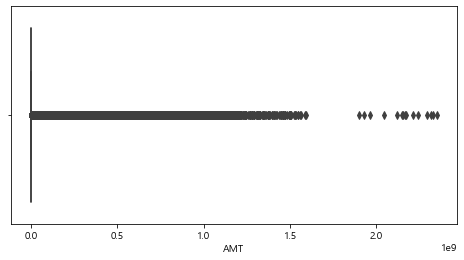

In [6]:


plt.figure(figsize=(8, 4))
sns.boxplot(train['AMT'])

In [7]:
pd.options.display.float_format = '{:.5f}'.format


In [8]:
#이용금액 (원)
train['AMT'].describe()

count     24697792.00000
mean       2441352.93750
std       17260959.04056
min             20.00000
25%          90200.00000
50%         252680.00000
75%         843337.25000
max     2349523701.00000
Name: AMT, dtype: float64

In [9]:
#이용고객수 (명)
train['CSTMR_CNT'].describe()

count   24697792.00000
mean          61.96855
std          355.91754
min            3.00000
25%            4.00000
50%            8.00000
75%           24.00000
max        32813.00000
Name: CSTMR_CNT, dtype: float64

In [10]:
#이용건수 (건)
train['CNT'].describe()

count   24697792.00000
mean         126.04497
std          966.93871
min            1.00000
25%            5.00000
50%           12.00000
75%           40.00000
max       120357.00000
Name: CNT, dtype: float64

In [11]:
#가구생애주기 
#1: 1인가구, 2: 영유아자녀가구, 3: 중고생자녀가구, 4: 성인자녀가구, 5: 노년가구
train['FLC'].describe()

count   24697792.00000
mean           2.80443
std            1.37546
min            1.00000
25%            2.00000
50%            3.00000
75%            4.00000
max            5.00000
Name: FLC, dtype: float64

In [12]:
print(len(train['FLC'].unique()))
train['FLC'].value_counts()

5


2    6188801
1    5526140
4    5445320
3    4054741
5    3482790
Name: FLC, dtype: int64

In [13]:
#pd.reset_option('display.float_format') 다시 지수표현으로

In [14]:
#REG_YYMM 년월
print(len(train['REG_YYMM'].unique()))
train['REG_YYMM'].value_counts()


15


201908    1880296
201905    1772237
201910    1751005
201909    1734914
201907    1721353
201906    1712696
201912    1674381
202001    1672889
201903    1668675
201904    1655655
201911    1652905
201901    1607032
201902    1594266
202002    1338980
202003    1260508
Name: REG_YYMM, dtype: int64

In [15]:
#CARD_SIDO_NM  카드이용지역_시도 (가맹점 주소 기준)
print(len(train['CARD_SIDO_NM'].unique()))
train['CARD_SIDO_NM'].value_counts()

17


서울    6259502
경기    5188230
부산    2030810
인천    1278410
강원    1230355
경남    1222818
경북    1204831
충남    1178159
충북     834707
전북     829466
전남     819291
대구     758424
대전     523121
제주     497503
광주     432150
울산     322802
세종      87213
Name: CARD_SIDO_NM, dtype: int64

In [16]:
# CARD_CCG_NM  카드이용지역_시군구 (가맹점 주소 기준)
print(len(train['CARD_CCG_NM'].unique()))
train['CARD_CCG_NM'].value_counts()

227


중구     1185474
남구      512319
동구      509407
서구      501952
강서구     490111
        ...   
청양군      13894
신안군      10296
울릉군      10210
봉화군       9841
영양군       5728
Name: CARD_CCG_NM, Length: 226, dtype: int64

In [17]:
#STD_CLSS_NM   업종명
print(len(train['STD_CLSS_NM'].unique()))
train['STD_CLSS_NM'].value_counts()
# 제출데이터 : 시도별로 41개씩 (04,07월) 총 82개 다 채워져 있음.

41


한식 음식점업                  3697166
체인화 편의점                  3210466
슈퍼마켓                     1630700
차량용 주유소 운영업              1613476
비알콜 음료점업                 1586120
기타 대형 종합 소매업             1495163
서양식 음식점업                 1404839
피자 햄버거 샌드위치 및 유사 음식점업    1351478
빵 및 과자류 소매업               989794
중식 음식점업                   698803
기타음식료품위주종합소매업             558716
기타 외국식 음식점업               556813
일식 음식점업                   539071
과실 및 채소 소매업               504479
스포츠 및 레크레이션 용품 임대업        466533
화장품 및 방향제 소매업             383713
택시 운송업                    381993
그외 기타 종합 소매업              351817
여관업                       334994
전시 및 행사 대행업               330569
육류 소매업                    327160
욕탕업                       259567
수산물 소매업                   255488
골프장 운영업                   236554
차량용 가스 충전업                218242
버스 운송업                    192281
일반유흥 주점업                  174081
호텔업                       155309
면세점                       144349
정기 항공 운송업                 115914
휴양콘도 운영업  

In [18]:
#HOM_SIDO_NM   거주지역_시도 (고객 집주소 기준)
print(len(train['HOM_SIDO_NM'].unique()))
train['HOM_SIDO_NM'].value_counts()

17


경기    6614016
서울    5387540
부산    1960951
경남    1463499
인천    1350921
대구    1077209
경북    1068082
충남     909568
전남     765499
전북     741515
충북     687090
광주     667626
강원     602004
대전     586938
울산     502297
제주     165250
세종     147787
Name: HOM_SIDO_NM, dtype: int64

In [19]:
# HOM_CCG_NM  거주지역_시군구 (고객 집주소 기준)
print(len(train['HOM_CCG_NM'].unique()))
train['HOM_CCG_NM'].value_counts()

227


서구     707806
남구     659294
북구     593152
동구     503304
중구     500592
        ...  
장수군     11529
군위군     10114
청송군     10015
영양군      7661
울릉군      5919
Name: HOM_CCG_NM, Length: 226, dtype: int64

In [20]:
#AGE 나이

print(len(train['AGE'].unique()))
train['AGE'].value_counts()

7


40s    5802447
30s    5550519
20s    5091675
50s    4455687
60s    2606168
70s     876622
10s     314674
Name: AGE, dtype: int64

In [21]:
#SEX_CTGO_CD 성별 (1: 남성, 2: 여성)
print(len(train['SEX_CTGO_CD'].unique()))
train['SEX_CTGO_CD'].value_counts()

2


1    14506378
2    10191414
Name: SEX_CTGO_CD, dtype: int64

In [22]:
print(len(train['FLC'].unique()))
train['FLC'].value_counts()

5


2    6188801
1    5526140
4    5445320
3    4054741
5    3482790
Name: FLC, dtype: int64

In [23]:
print(len(train['CSTMR_CNT'].unique()))
train['CSTMR_CNT'].value_counts()

12794


3        5642751
4        2451346
6        1415534
5        1296443
7        1126747
          ...   
10446          1
10441          1
10440          1
10443          1
16376          1
Name: CSTMR_CNT, Length: 12794, dtype: int64

In [268]:
# 업종별로 년-월별 매출 합 계산
std_class_ym=train[['REG_YYMM','STD_CLSS_NM','AMT']].groupby(['STD_CLSS_NM','REG_YYMM']).sum() 

In [269]:
std_class_ym.head(30)

AMT
STD_CLSS_NM REG_YYMM             
건강보조식품 소매업  201901     8605074944
            201902     7695979668
            201903     6307887107
            201904     6189621059
            201905     7930621122
            201906     6235724774
            201907     5812021661
            201908     5825692808
            201909     9824964625
            201910     7243896123
            201911     6148728199
            201912     5831396872
            202001    10380995655
            202002     5340082879
            202003     5753676884
골프장 운영업     201901    11968748603
            201902    16172821771
            201903    42108966385
            201904    51594105911
            201905    61560857446
            201906    60816504109
            201907    51603437320
            201908    47137504416
            201909    47971421728
            201910    60274503432
            201911    50676272989
            201912    22775041883
            202001    13414089759
            202002    18228841136
            202003    39398851940

In [26]:
trainh=train.pivot_table(index="REG_YYMM",columns="STD_CLSS_NM",values="AMT",aggfunc="sum")
trainh

STD_CLSS_NM,건강보조식품 소매업,골프장 운영업,과실 및 채소 소매업,관광 민예품 및 선물용품 소매업,그외 기타 분류안된 오락관련 서비스업,그외 기타 스포츠시설 운영업,그외 기타 종합 소매업,기타 대형 종합 소매업,기타 수상오락 서비스업,기타 외국식 음식점업,...,중식 음식점업,차량용 가스 충전업,차량용 주유소 운영업,체인화 편의점,택시 운송업,피자 햄버거 샌드위치 및 유사 음식점업,한식 음식점업,호텔업,화장품 및 방향제 소매업,휴양콘도 운영업
REG_YYMM,,,,,,,,,,,,,,,,,,,,,
201901,8605074944,11968748603,44453112689,955750428,1017500,305925950,73748981612,538843857358,127107192,45665083827,...,62665004697,16846765168,483447902660,316314464923,107747926483,75362999290,944187262326,19810557915,49431741234,8224321688
201902,7695979668,16172821771,41217254299,836063298,2171200,261992400,65240336771,484343025141,106949630,38572881680,...,59172364534,14862983953,420183533685,283482039151,100387649746,68454177238,828212673196,15695213582,42678743429,6104431321
201903,6307887107,42108966385,38415185909,1018056196,2005500,231791910,63325621140,517323547314,112604480,45944677941,...,67840648226,16468348269,499290480565,343297549867,112410966348,75701534533,979787456428,13817431974,48695291945,3378598195
201904,6189621059,51594105911,37929318326,1132707516,1945000,146125100,61642072463,494817697752,109081230,43459624678,...,63756965708,15366221250,500426190266,339368118284,119090676693,75046904161,929119635382,13639159307,46289777960,2854341346
201905,7930621122,61560857446,40109803493,1227161510,2431000,179603820,68730852590,524741382417,141142205,43973488460,...,68027851961,16826179031,554833565580,377219352474,123211255186,79222053101,1015171813989,16165528501,48756280366,4357229972
201906,6235724774,60816504109,37596533926,1078516132,3294000,198211860,63218879351,470795799066,138045750,40876110018,...,65109670937,16217769932,521482750657,381391802266,115315039720,77478178376,960618569071,13652917977,45758001314,4185033466
201907,5812021661,51603437320,34722470972,947813541,3229370,180582528,63769792145,504817794698,147046573,41933644755,...,67091569114,15490004307,516825325346,386928614266,130881819332,80015933980,981571628843,14091286013,43701126839,7140818167
201908,5825692808,47137504416,39038864865,1209506009,6102670,242269649,67608321538,491858368373,174004536,42239281833,...,65797678657,16117616604,559073100080,393665691278,123702244107,79914002567,1010730528577,18614699092,42823670953,13121845211
201909,9824964625,47971421728,49636213189,888723804,4345650,159768830,75869764181,513691411678,129194820,40153057754,...,61776234983,14773738361,515931587383,379784587604,125292165688,73474585461,889663829822,12732299741,40055857449,3764060856


In [27]:
trainh.isnull().sum()

STD_CLSS_NM
건강보조식품 소매업               0
골프장 운영업                  0
과실 및 채소 소매업              0
관광 민예품 및 선물용품 소매업        0
그외 기타 분류안된 오락관련 서비스업     0
그외 기타 스포츠시설 운영업          0
그외 기타 종합 소매업             0
기타 대형 종합 소매업             0
기타 수상오락 서비스업             0
기타 외국식 음식점업              0
기타 주점업                   0
기타음식료품위주종합소매업            0
내항 여객 운송업                0
마사지업                     0
면세점                      0
버스 운송업                   0
비알콜 음료점업                 0
빵 및 과자류 소매업              0
서양식 음식점업                 0
수산물 소매업                  0
슈퍼마켓                     0
스포츠 및 레크레이션 용품 임대업       0
여관업                      0
여행사업                     0
욕탕업                      0
육류 소매업                   0
일반유흥 주점업                 0
일식 음식점업                  0
자동차 임대업                  0
전시 및 행사 대행업              0
정기 항공 운송업                0
중식 음식점업                  0
차량용 가스 충전업               0
차량용 주유소 운영업              0
체인화 편의점                  0
택시 운송업                   0
피자 햄버거 샌드위치 및 유사

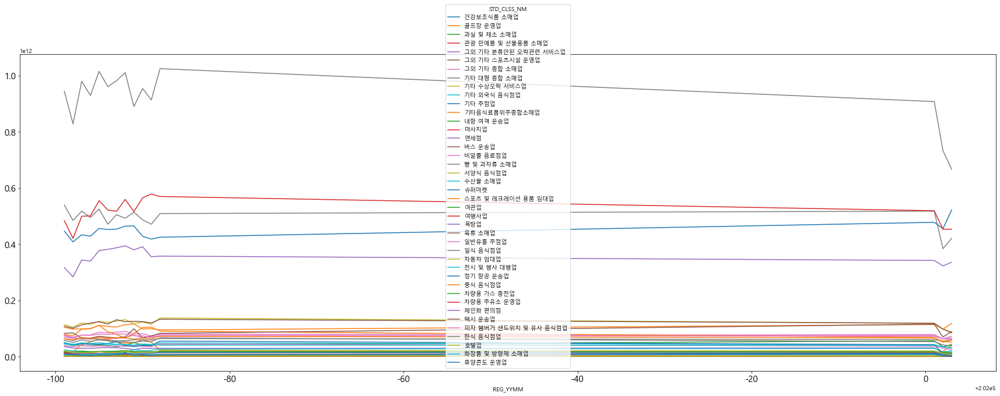

In [28]:
pd.options.display.float_format = '{:.5f}'.format
trainh.plot(kind="line",figsize=(30,10),fontsize=15)

In [29]:
std_class_ym1=train[['STD_CLSS_NM','AMT']].groupby(['STD_CLSS_NM']).sum() 

In [30]:
std_class_ym1.sort_values(by='AMT',ascending=False)
# 자료 갯수도 한식 음식점업,체인화 편의점,슈퍼마켓,차량용 주유소 운영업 순서로 많음

,AMT
STD_CLSS_NM,
한식 음식점업,13737489719551
차량용 주유소 운영업,7708652073883
기타 대형 종합 소매업,7328854819388
슈퍼마켓,6730329364274
체인화 편의점,5303958703193
서양식 음식점업,1748358904526
택시 운송업,1733409541974
기타음식료품위주종합소매업,1569246626978
스포츠 및 레크레이션 용품 임대업,1245725426753


## 2. 전처리 (null값 처리)

In [31]:
train.isnull().sum()

REG_YYMM             0
CARD_SIDO_NM         0
CARD_CCG_NM      87213
STD_CLSS_NM          0
HOM_SIDO_NM          0
HOM_CCG_NM      147787
AGE                  0
SEX_CTGO_CD          0
FLC                  0
CSTMR_CNT            0
AMT                  0
CNT                  0
dtype: int64

In [32]:
for i in train['CARD_SIDO_NM'].unique():
    print(i)
    print(train.loc[train['CARD_SIDO_NM'] == i].isnull().sum())
    print('')

강원
REG_YYMM           0
CARD_SIDO_NM       0
CARD_CCG_NM        0
STD_CLSS_NM        0
HOM_SIDO_NM        0
HOM_CCG_NM      4219
AGE                0
SEX_CTGO_CD        0
FLC                0
CSTMR_CNT          0
AMT                0
CNT                0
dtype: int64

경기
REG_YYMM            0
CARD_SIDO_NM        0
CARD_CCG_NM         0
STD_CLSS_NM         0
HOM_SIDO_NM         0
HOM_CCG_NM      18154
AGE                 0
SEX_CTGO_CD         0
FLC                 0
CSTMR_CNT           0
AMT                 0
CNT                 0
dtype: int64

경남
REG_YYMM           0
CARD_SIDO_NM       0
CARD_CCG_NM        0
STD_CLSS_NM        0
HOM_SIDO_NM        0
HOM_CCG_NM      2610
AGE                0
SEX_CTGO_CD        0
FLC                0
CSTMR_CNT          0
AMT                0
CNT                0
dtype: int64

경북
REG_YYMM           0
CARD_SIDO_NM       0
CARD_CCG_NM        0
STD_CLSS_NM        0
HOM_SIDO_NM        0
HOM_CCG_NM      4778
AGE                0
SEX_CTGO_CD        0
FLC       

In [33]:
#  CARD_CCG_NM 의 null값 모두 sido 세종. 따라서 세종시로 채우기

In [34]:
train['CARD_CCG_NM'].fillna('세종시', inplace=True)

In [115]:
train.isnull().sum()

REG_YYMM             0
CARD_SIDO_NM         0
CARD_CCG_NM          0
STD_CLSS_NM          0
HOM_SIDO_NM          0
HOM_CCG_NM      147787
AGE                  0
SEX_CTGO_CD          0
FLC                  0
CSTMR_CNT            0
AMT                  0
CNT                  0
dtype: int64

In [116]:
for i in train['HOM_SIDO_NM'].unique():
    print(i)
    print(train.loc[train['HOM_SIDO_NM'] == i].isnull().sum())
    print('')

강원
REG_YYMM        0
CARD_SIDO_NM    0
CARD_CCG_NM     0
STD_CLSS_NM     0
HOM_SIDO_NM     0
HOM_CCG_NM      0
AGE             0
SEX_CTGO_CD     0
FLC             0
CSTMR_CNT       0
AMT             0
CNT             0
dtype: int64

경기
REG_YYMM        0
CARD_SIDO_NM    0
CARD_CCG_NM     0
STD_CLSS_NM     0
HOM_SIDO_NM     0
HOM_CCG_NM      0
AGE             0
SEX_CTGO_CD     0
FLC             0
CSTMR_CNT       0
AMT             0
CNT             0
dtype: int64

서울
REG_YYMM        0
CARD_SIDO_NM    0
CARD_CCG_NM     0
STD_CLSS_NM     0
HOM_SIDO_NM     0
HOM_CCG_NM      0
AGE             0
SEX_CTGO_CD     0
FLC             0
CSTMR_CNT       0
AMT             0
CNT             0
dtype: int64

경남
REG_YYMM        0
CARD_SIDO_NM    0
CARD_CCG_NM     0
STD_CLSS_NM     0
HOM_SIDO_NM     0
HOM_CCG_NM      0
AGE             0
SEX_CTGO_CD     0
FLC             0
CSTMR_CNT       0
AMT             0
CNT             0
dtype: int64

경북
REG_YYMM        0
CARD_SIDO_NM    0
CARD_CCG_NM     0
STD_CLSS_NM

In [117]:
train['HOM_CCG_NM'].fillna('세종시', inplace=True)

## 3. 시각화(기본)

#### x=업종, y=이용 건수 (CNT 의 SUM)

In [248]:
cnt_clss=train[['STD_CLSS_NM','CNT']].groupby("STD_CLSS_NM").sum()
cnt_clss

,CNT
STD_CLSS_NM,
건강보조식품 소매업,1097627
골프장 운영업,4951383
과실 및 채소 소매업,24497628
관광 민예품 및 선물용품 소매업,593750
그외 기타 분류안된 오락관련 서비스업,1410
그외 기타 스포츠시설 운영업,140173
그외 기타 종합 소매업,21529262
기타 대형 종합 소매업,231338754
기타 수상오락 서비스업,50765


In [249]:
cnt_clss = amt_clss.reset_index()
cnt_clss=amt_clss.sort_values(by="CNT",ascending=False)
cnt_clss

,STD_CLSS_NM,CNT
34,체인화 편의점,786933354
37,한식 음식점업,459130888
20,슈퍼마켓,422258631
7,기타 대형 종합 소매업,231338754
35,택시 운송업,231011553
16,비알콜 음료점업,164698712
33,차량용 주유소 운영업,138163614
18,서양식 음식점업,116457610
36,피자 햄버거 샌드위치 및 유사 음식점업,111352234
17,빵 및 과자류 소매업,88422041


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40]),
 <a list of 41 Text xticklabel objects>)

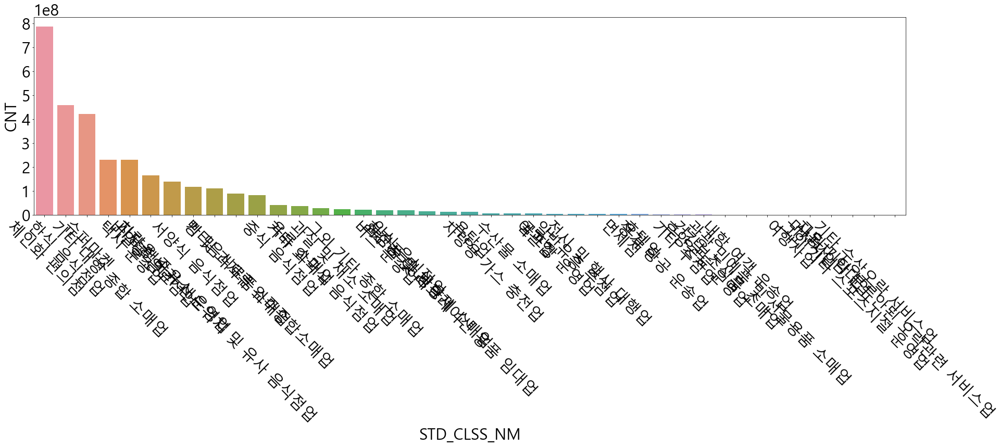

In [250]:
plt.figure(figsize=(30,7))
# amt_clss.plot(kind="bar",figsize=(30,10),fontsize=15)
sns.barplot(data=cnt_clss , x='STD_CLSS_NM', y='CNT')
plt.rc('font', size=15)
plt.xticks(rotation = -45 )

#### x=시도, y=이용 건수

In [229]:
cnt_sido=train[['CARD_SIDO_NM','CNT']].groupby("CARD_SIDO_NM").sum()
cnt_sido


,CNT
CARD_SIDO_NM,
강원,64382529
경기,701143788
경남,149370331
경북,113078004
광주,82758813
대구,164232841
대전,60900956
부산,228178463
서울,994077624


In [230]:

cnt_sido= amt_sido.reset_index()
cnt_sido=amt_sido.sort_values(by="CNT",ascending=False)
cnt_sido

,CARD_SIDO_NM,CNT
8,서울,994077624
1,경기,701143788
7,부산,228178463
5,대구,164232841
2,경남,149370331
11,인천,147173793
3,경북,113078004
15,충남,91093453
4,광주,82758813
13,전북,80723851


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16]),
 <a list of 17 Text xticklabel objects>)

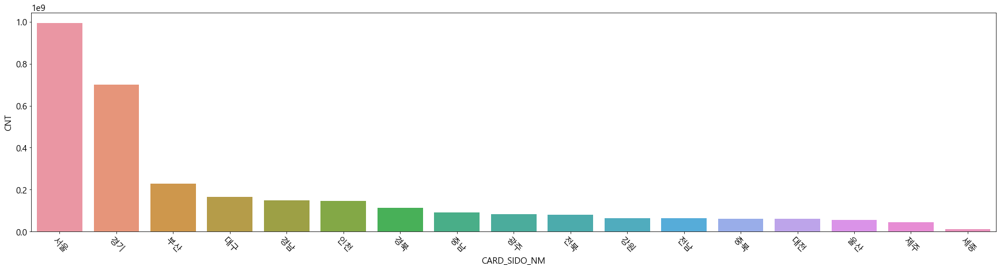

In [231]:
plt.figure(figsize=(30,7))
# amt_clss.plot(kind="bar",figsize=(30,10),fontsize=15)
sns.barplot(data=cnt_sido , x='CARD_SIDO_NM', y='CNT')
plt.rc('font', size=15)
plt.xticks(rotation = -45 )

#### 업종별 x=시도, y=CNT 이용건수

In [181]:
# 업종별로 시도 
std_class_sido=train[['CARD_SIDO_NM','STD_CLSS_NM','CNT']].groupby(['STD_CLSS_NM','CARD_SIDO_NM']).sum()

In [182]:
std_class_sido

CNT
STD_CLSS_NM CARD_SIDO_NM        
건강보조식품 소매업  강원             16170
            경기            227521
            경남             52310
            경북             28506
            광주             28428
...                          ...
휴양콘도 운영업    전남             73010
            전북             92415
            제주            107836
            충남             67556
            충북             40731

[650 rows x 1 columns]

In [126]:
# std_class_sido = std_class_sido.reset_index()
# std_class_sido

In [127]:
# std_class_sido.set_index("STD_CLSS_NM",inplace=True)
# std_class_sido

In [128]:
CLSS_NM_uniq=train['STD_CLSS_NM'].unique()

In [129]:
CLSS_NM_uniq[0]

'건강보조식품 소매업'

C:\Users\noeul\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


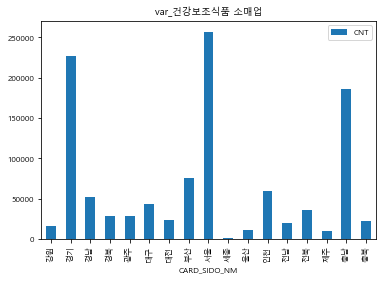

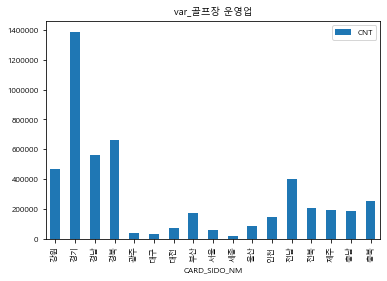

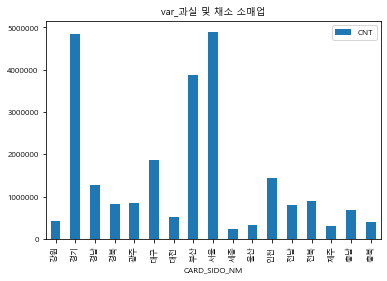

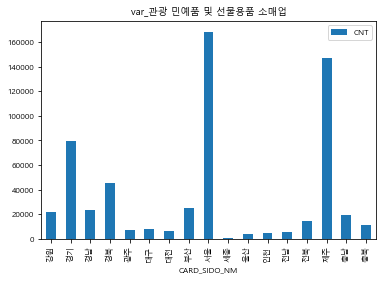

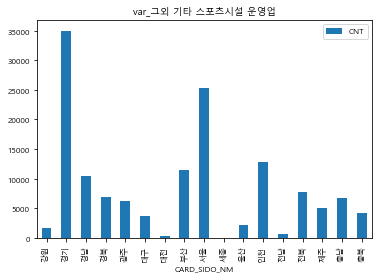

...

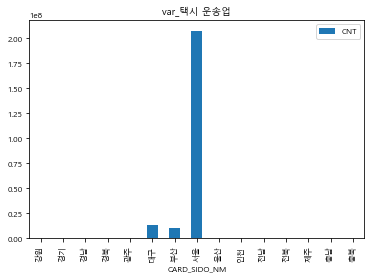

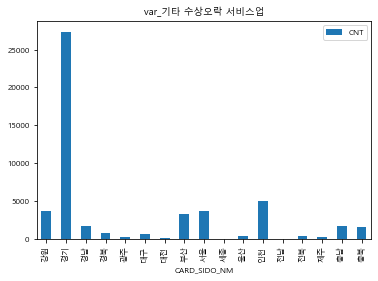

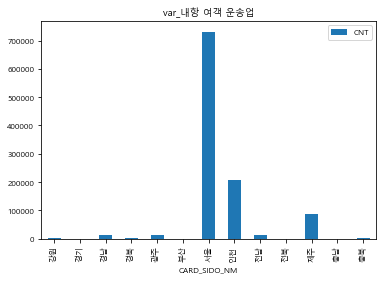

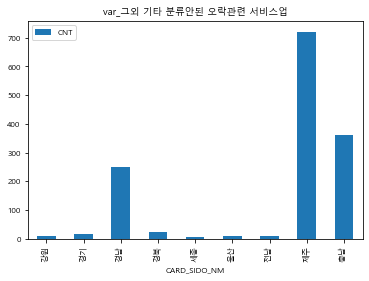

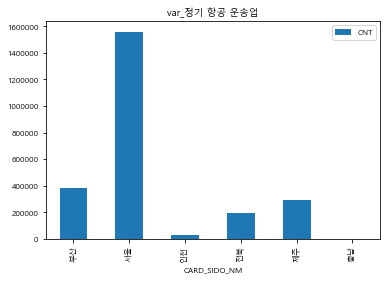

In [183]:
a=[]
b=[]
for i in CLSS_NM_uniq :
#     print('var_{}'.format(i))
    a.append('var_{}'.format(i))
    b.append('var_{}'.format(i))

for i in range(len(CLSS_NM_uniq)) :
    c=b[i]    
    a[i]=std_class_sido.loc[CLSS_NM_uniq[i]]
    
    plt.rc('font', size=8)
    a[i].plot(kind='bar')
    
    plt.title(c)

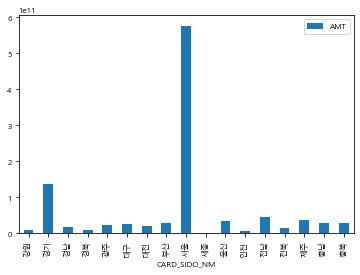

In [153]:
#확인
ch=std_class_sido.loc["그외 기타 종합 소매업"]
plt.rc('font', size=8)
ch.plot(kind='bar')

In [184]:
# 시도별로 업종
std_sido_class=train[['STD_CLSS_NM','CARD_SIDO_NM','CNT']].groupby(['CARD_SIDO_NM','STD_CLSS_NM']).sum()

In [226]:
clss_sido_amt_sum = train.groupby(['STD_CLSS_NM','CARD_SIDO_NM'])['AMT'].sum()
clss_sido_amt_sum = pd.DataFrame(clss_sido_amt_sum)
clss_sido_amt_sum

AMT
STD_CLSS_NM CARD_SIDO_NM             
건강보조식품 소매업  강원             1820824382
            경기            21313151258
            경남             5406038964
            경북             3564454980
            광주             3619007849
...                               ...
휴양콘도 운영업    전남             4192316889
            전북             6346178051
            제주             7475474469
            충남             3967138248
            충북             2414736980

[650 rows x 1 columns]

In [185]:
std_sido_class

CNT
CARD_SIDO_NM STD_CLSS_NM                    
강원           건강보조식품 소매업                16170
             골프장 운영업                  465266
             과실 및 채소 소매업              428427
             관광 민예품 및 선물용품 소매업         22012
             그외 기타 분류안된 오락관련 서비스업         10
...                                      ...
충북           피자 햄버거 샌드위치 및 유사 음식점업   2004621
             한식 음식점업                11522939
             호텔업                       11641
             화장품 및 방향제 소매업            224483
             휴양콘도 운영업                  40731

[650 rows x 1 columns]

In [186]:
std_sido_class.loc["강원"]

,CNT
STD_CLSS_NM,
건강보조식품 소매업,16170
골프장 운영업,465266
과실 및 채소 소매업,428427
관광 민예품 및 선물용품 소매업,22012
그외 기타 분류안된 오락관련 서비스업,10
그외 기타 스포츠시설 운영업,1639
그외 기타 종합 소매업,206236
기타 대형 종합 소매업,3023973
기타 수상오락 서비스업,3698


In [187]:
SIDO_NM_uniq=train['CARD_SIDO_NM'].unique()
SIDO_NM_uniq

array(['강원', '경기', '경남', '경북', '광주', '대구', '대전', '부산', '서울', '세종', '울산',
       '인천', '전남', '전북', '제주', '충남', '충북'], dtype=object)

In [188]:
range(len(SIDO_NM_uniq))

range(0, 17)

In [189]:
SIDO_NM_uniq[0]

'강원'

In [190]:
a=[]
b=[]
for i in SIDO_NM_uniq :
#     print('var_{}'.format(i))
    a.append('var_{}'.format(i))
    b.append('var_{}'.format(i))
    

In [191]:

c=b[2] 
c

'var_경남'

C:\Users\noeul\anaconda3\lib\site-packages\ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
C:\Users\noeul\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


<Figure size 2160x504 with 0 Axes>

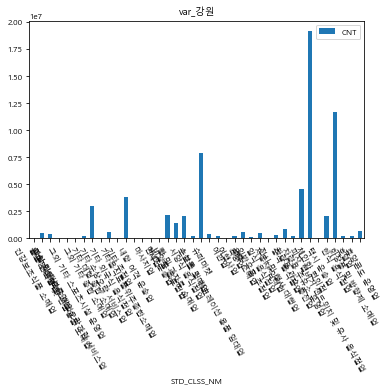

<Figure size 2160x504 with 0 Axes>

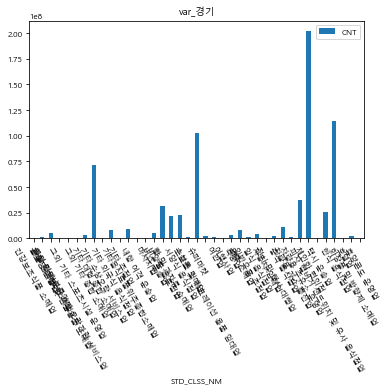

<Figure size 2160x504 with 0 Axes>

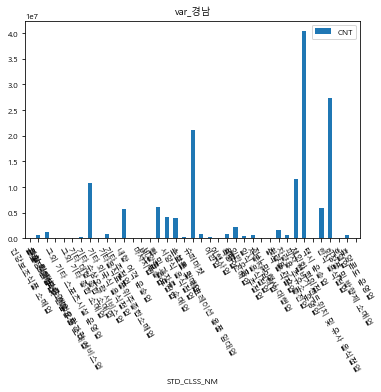

<Figure size 2160x504 with 0 Axes>

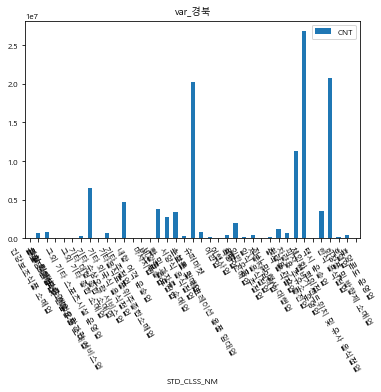

<Figure size 2160x504 with 0 Axes>

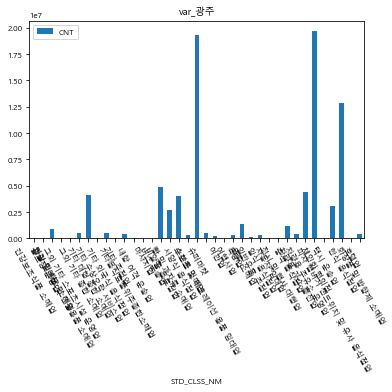

<Figure size 2160x504 with 0 Axes>

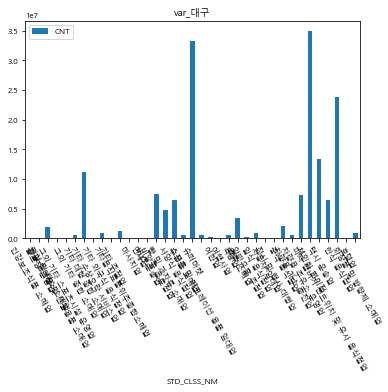

<Figure size 2160x504 with 0 Axes>

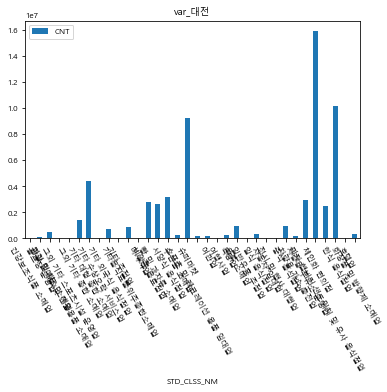

<Figure size 2160x504 with 0 Axes>

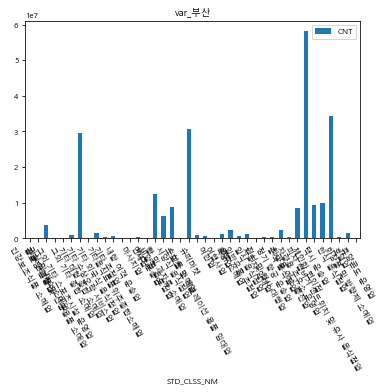

<Figure size 2160x504 with 0 Axes>

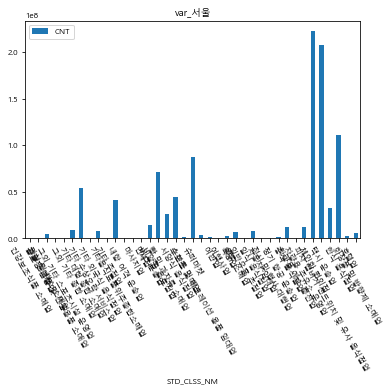

<Figure size 2160x504 with 0 Axes>

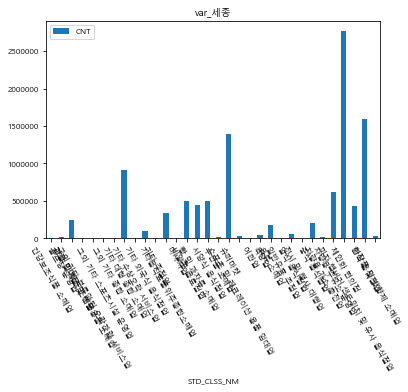

<Figure size 2160x504 with 0 Axes>

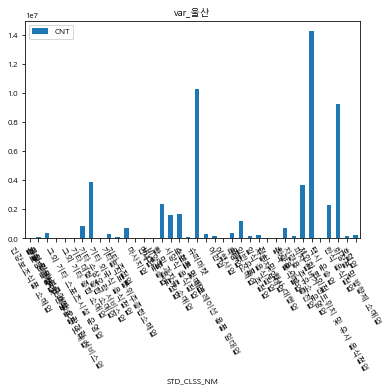

<Figure size 2160x504 with 0 Axes>

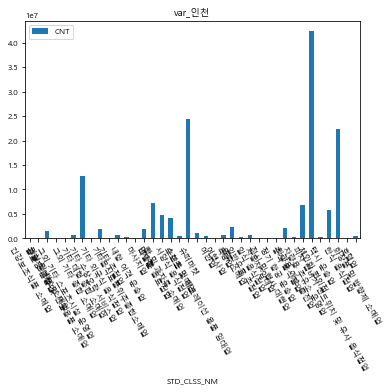

<Figure size 2160x504 with 0 Axes>

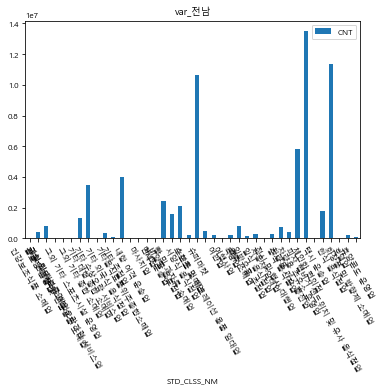

<Figure size 2160x504 with 0 Axes>

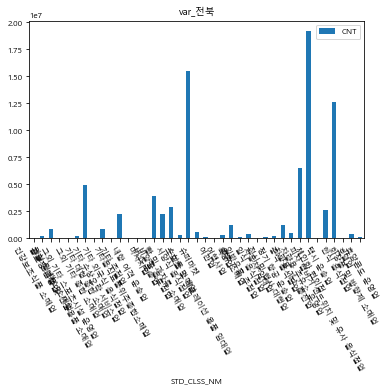

<Figure size 2160x504 with 0 Axes>

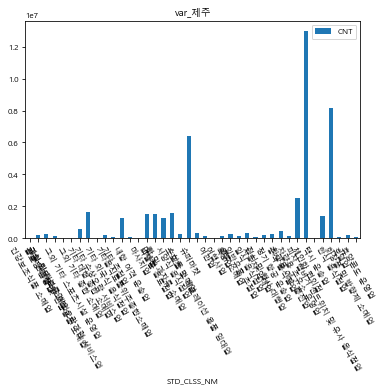

<Figure size 2160x504 with 0 Axes>

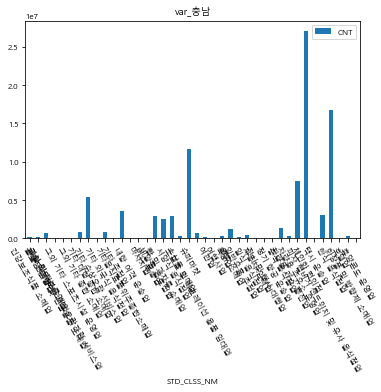

<Figure size 2160x504 with 0 Axes>

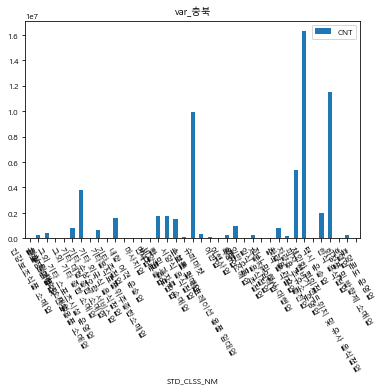

In [192]:
a=[]
b=[]
for i in SIDO_NM_uniq :
#     print('var_{}'.format(i))
    a.append('var_{}'.format(i))
    b.append('var_{}'.format(i))
    

for i in range(len(SIDO_NM_uniq)) :
    c=b[i]    
    a[i]=std_sido_class.loc[SIDO_NM_uniq[i]]
    
    plt.figure(figsize=(30,7))
    plt.rc('font', size=8)
    a[i].plot(kind='bar')
    
    plt.title(c)
    plt.xticks(rotation = - 60 )

## 시도, 업종별 AMT 합계 평균 시각화

In [161]:
sido_amt_sum = train.groupby(['CARD_SIDO_NM'])['AMT'].sum()
sido_amt_mean = train.groupby(['CARD_SIDO_NM'])['AMT'].mean()
clss_amt_sum = train.groupby(['STD_CLSS_NM'])['AMT'].sum()
clss_amt_mean = train.groupby(['STD_CLSS_NM'])['AMT'].mean()

In [227]:
sido_amt_sum

,AMT
CARD_SIDO_NM,
서울,14677131049031
경기,14201885234869
부산,4491306031541
경남,3485130029864
인천,3056247462913
대구,3020064352604
경북,2767620595248
충남,2103197375108
전북,1961230185341


In [228]:
clss_amt_sum

,AMT
STD_CLSS_NM,
한식 음식점업,13737489719551
차량용 주유소 운영업,7708652073883
기타 대형 종합 소매업,7328854819388
슈퍼마켓,6730329364274
체인화 편의점,5303958703193
서양식 음식점업,1748358904526
택시 운송업,1733409541974
기타음식료품위주종합소매업,1569246626978
스포츠 및 레크레이션 용품 임대업,1245725426753


In [162]:
sido_amt_sum = pd.DataFrame(sido_amt_sum)
sido_amt_mean = pd.DataFrame(sido_amt_mean)
clss_amt_sum = pd.DataFrame(clss_amt_sum)
clss_amt_mean = pd.DataFrame(clss_amt_mean)

In [163]:
sido_amt_sum.sort_values(by = 'AMT',ascending=False, inplace=True)
sido_amt_mean.sort_values(by = 'AMT',ascending=False, inplace=True)
clss_amt_sum.sort_values(by = 'AMT',ascending=False, inplace=True)
clss_amt_mean.sort_values(by = 'AMT',ascending=False, inplace=True)

Text(0.5, 1.0, '시도별 전체 거래가의 합')

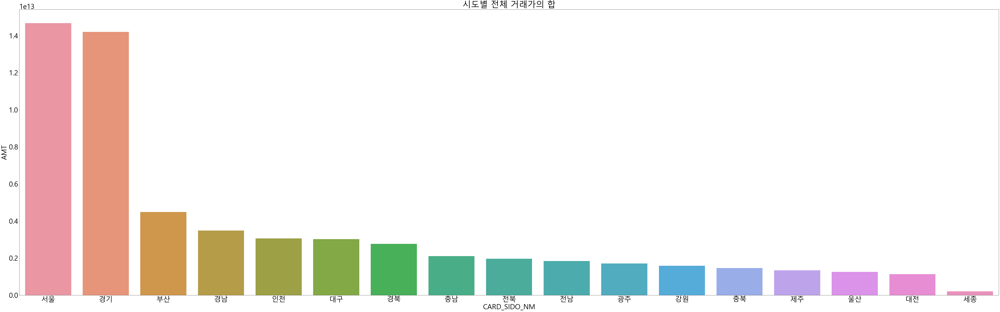

In [164]:
"""sido_amt_sum.plot.bar()
sido_amt_mean.plot.bar()
clss_amt_sum.plot.bar()
clss_amt_mean.plot.bar()
"""
plt.figure(figsize = (100,30))
plt.rcParams.update({'font.size': 40})
b = sns.barplot(data= sido_amt_sum,x= sido_amt_sum.index, y= 'AMT')
plt.title("시도별 전체 거래가의 합")

Text(0.5, 1.0, '시도별 전체 거래가의 평균')

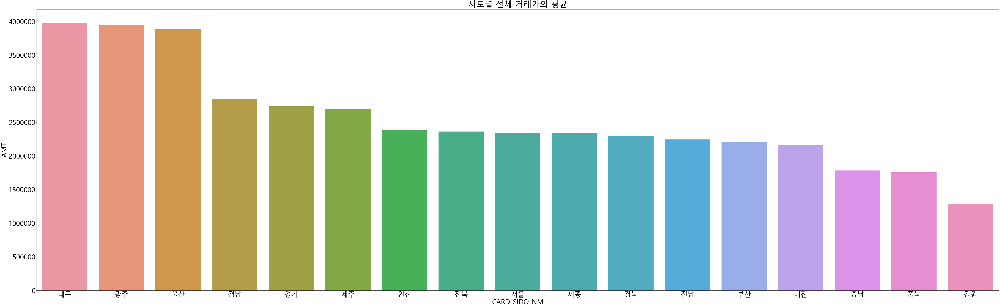

In [165]:
plt.figure(figsize = (100,30))
plt.rcParams.update({'font.size': 40})
b = sns.barplot(data= sido_amt_mean,x= sido_amt_mean.index, y= 'AMT')
plt.title("시도별 전체 거래가의 평균")

Text(0.5, 1.0, '업종별 전체 거래가의 합')

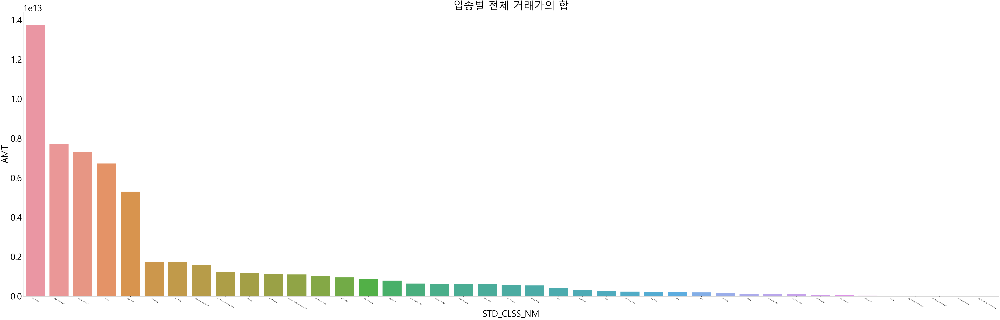

In [166]:
plt.figure(figsize = (100,30))
plt.rcParams.update({'font.size': 50})
b = sns.barplot(data= clss_amt_sum,x= clss_amt_sum.index, y= 'AMT')
b.set_xticklabels(b.get_xticklabels(), fontsize=7)
plt.xticks(rotation = -30 )
plt.title("업종별 전체 거래가의 합")

Text(0.5, 1.0, '업종별 전체 거래가의 평균')

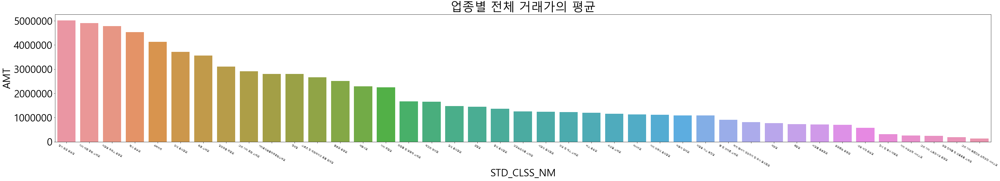

In [167]:
plt.figure(figsize = (50,7))
plt.rcParams.update({'font.size': 30})
b = sns.barplot(data= clss_amt_mean,x= clss_amt_mean.index, y= 'AMT')
b.set_xticklabels(b.get_xticklabels(), fontsize=7)
plt.xticks(rotation = -30 )

plt.title("업종별 전체 거래가의 평균")

## 업종별을 시도로 나눠서 AMT 평균

In [168]:
# 업종추출
clss = train['STD_CLSS_NM']

clss = list(clss)
clss = set(clss)
clss = list(clss)
clss

['그외 기타 분류안된 오락관련 서비스업',
 '과실 및 채소 소매업',
 '차량용 가스 충전업',
 '마사지업',
 '정기 항공 운송업',
 '화장품 및 방향제 소매업',
 '육류 소매업',
 '여행사업',
 '중식 음식점업',
 '택시 운송업',
 '기타 외국식 음식점업',
 '골프장 운영업',
 '기타 수상오락 서비스업',
 '비알콜 음료점업',
 '수산물 소매업',
 '전시 및 행사 대행업',
 '한식 음식점업',
 '그외 기타 종합 소매업',
 '면세점',
 '휴양콘도 운영업',
 '빵 및 과자류 소매업',
 '버스 운송업',
 '기타음식료품위주종합소매업',
 '피자 햄버거 샌드위치 및 유사 음식점업',
 '자동차 임대업',
 '건강보조식품 소매업',
 '스포츠 및 레크레이션 용품 임대업',
 '관광 민예품 및 선물용품 소매업',
 '욕탕업',
 '기타 대형 종합 소매업',
 '호텔업',
 '슈퍼마켓',
 '차량용 주유소 운영업',
 '일반유흥 주점업',
 '기타 주점업',
 '여관업',
 '서양식 음식점업',
 '체인화 편의점',
 '그외 기타 스포츠시설 운영업',
 '일식 음식점업',
 '내항 여객 운송업']

In [169]:
clss_sido_amt_sum = train.groupby(['STD_CLSS_NM','CARD_SIDO_NM'])['AMT'].sum()
clss_sido_amt_sum = pd.DataFrame(clss_sido_amt_sum)

In [170]:
#clss_sido_amt_mean.loc[clss[0]]
#np.argsort(clss_sido_amt_mean.loc[clss[0]]['AMT'])

In [171]:
clss_sido_amt_sum.loc[clss[1]].sort_values(by = 'AMT', ascending = False)

,AMT
CARD_SIDO_NM,
서울,110331062192
경기,104789326737
부산,69244220590
경남,42281889072
인천,42225501163
대구,36395145714
전남,34791656866
경북,29057027933
광주,27007077534


C:\Users\noeul\anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.
C:\Users\noeul\anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.
C:\Users\noeul\anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may cons

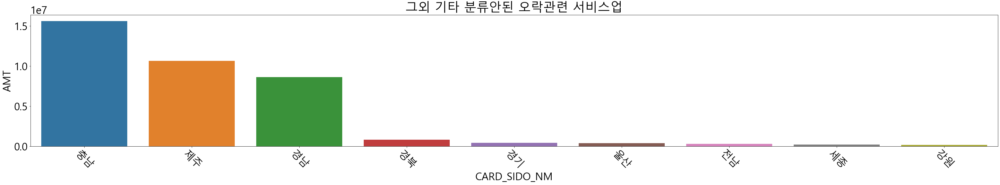

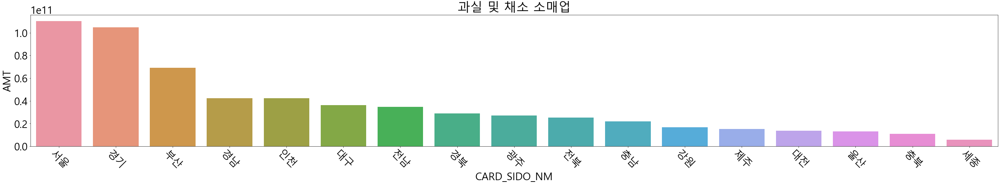

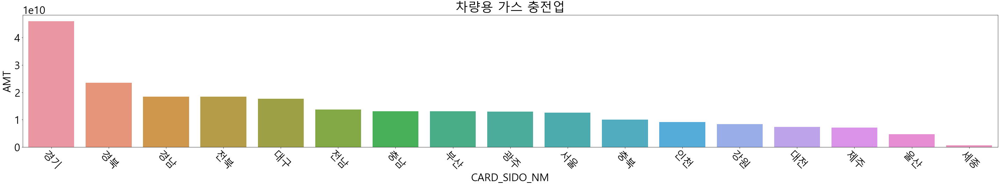

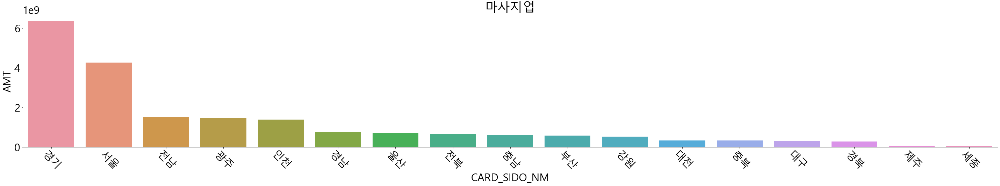

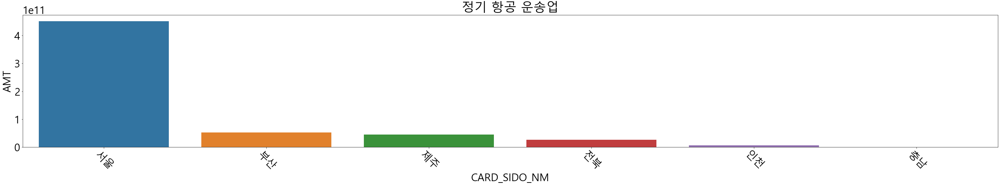

...

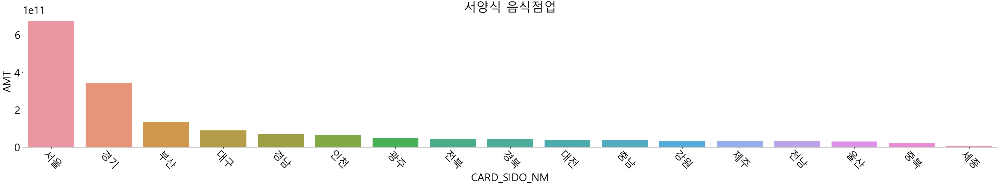

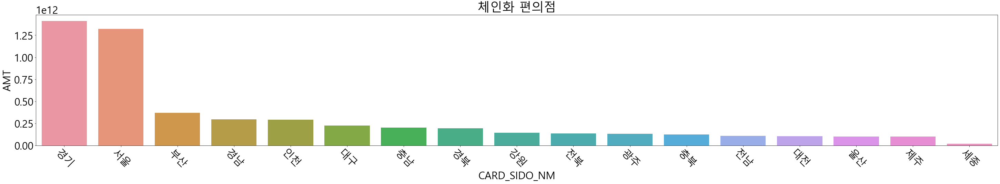

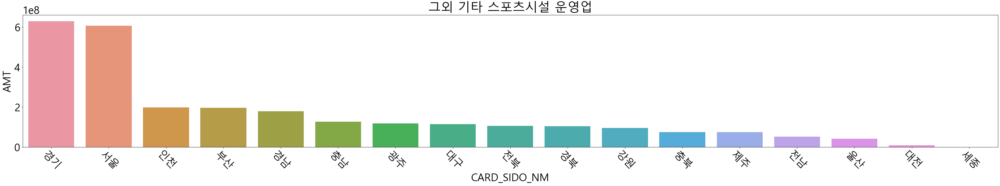

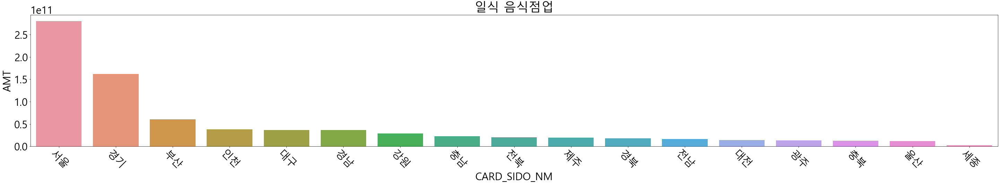

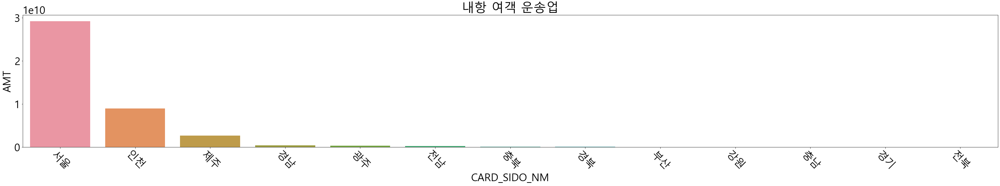

In [172]:
a = 0
for i in clss:
    data = clss_sido_amt_sum.loc[clss[a]].sort_values(by = 'AMT', ascending = False)
    plt.figure(figsize = (50,7))
    plt.rcParams.update({'font.size': 30})
    plt.xticks(rotation = - 45 )
    b = sns.barplot(data= data, x= data.index, y= 'AMT')
    plt.title(i)
    a+=1

In [173]:
clss_sido_amt_mean = train.groupby(['STD_CLSS_NM','CARD_SIDO_NM'])['AMT'].mean()
clss_sido_amt_mean = pd.DataFrame(clss_sido_amt_mean)

C:\Users\noeul\anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.
C:\Users\noeul\anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.
C:\Users\noeul\anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may cons

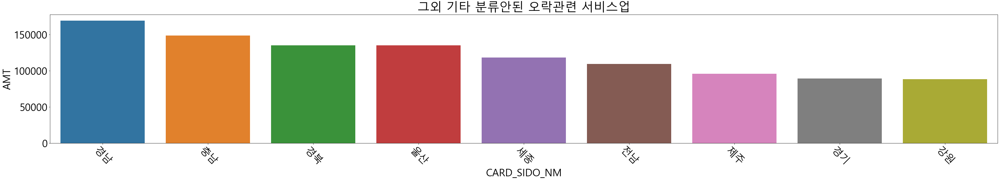

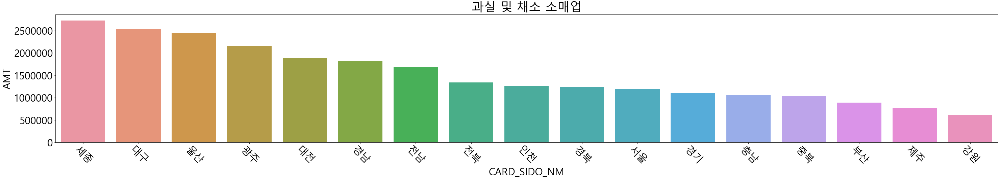

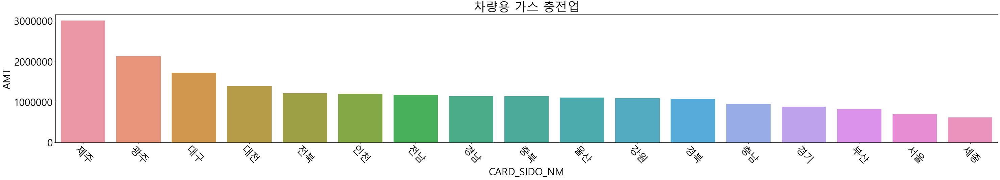

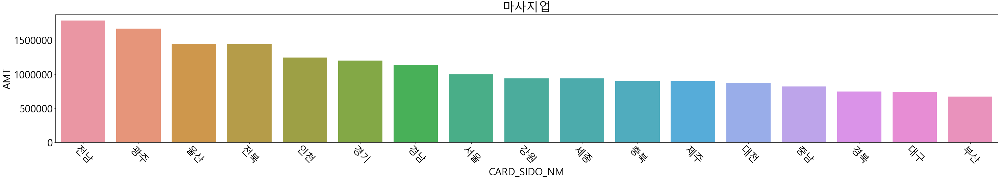

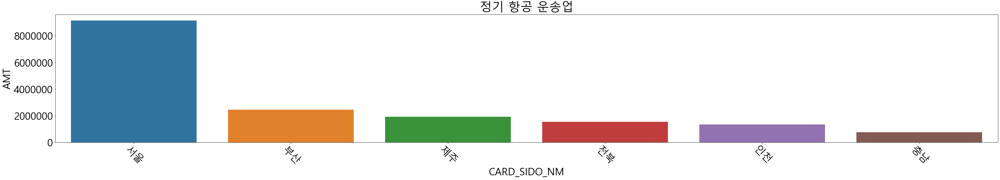

...

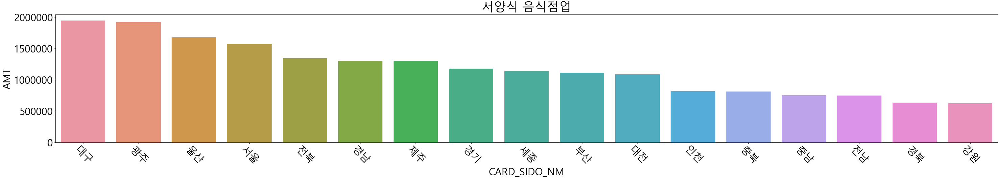

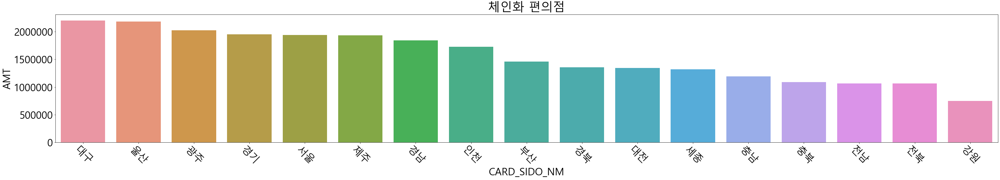

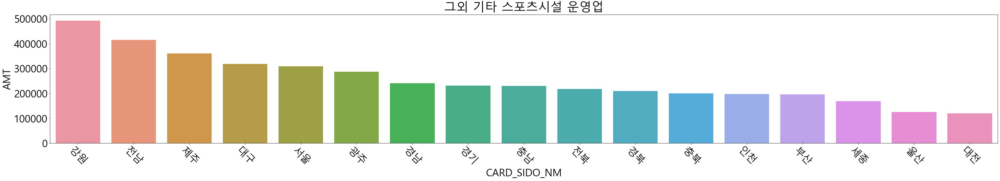

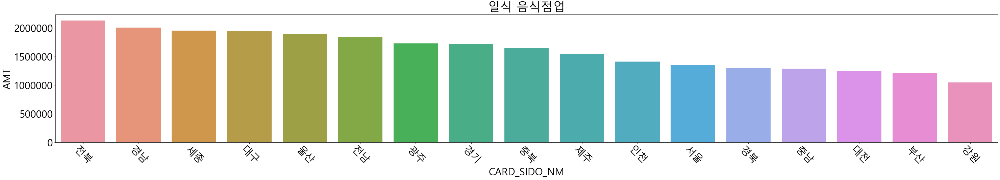

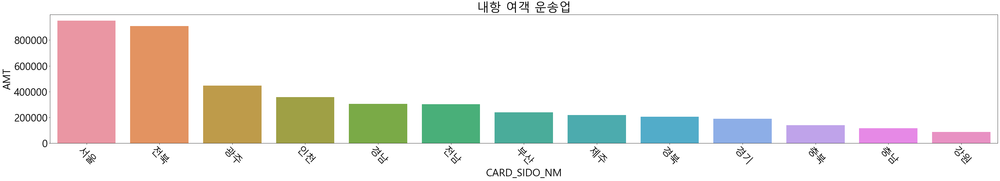

In [174]:
a = 0
for i in clss:
    data = clss_sido_amt_mean.loc[clss[a]].sort_values(by = 'AMT', ascending = False)
    plt.figure(figsize = (50,7))
    plt.rcParams.update({'font.size': 30})
    plt.xticks(rotation = - 45 )
    b = sns.barplot(data= data, x= data.index, y= 'AMT')
    plt.title(i)
    a+=1

In [175]:
# 시도추출
sido = train['CARD_SIDO_NM']

sido = list(sido)
sido = set(sido)
sido = list(sido)
sido

['울산',
 '광주',
 '전남',
 '제주',
 '충남',
 '강원',
 '부산',
 '경남',
 '인천',
 '경기',
 '충북',
 '대전',
 '경북',
 '전북',
 '대구',
 '세종',
 '서울']

In [176]:
sido_clss_amt_mean = train.groupby(['CARD_SIDO_NM','STD_CLSS_NM'])['AMT'].mean()
sido_clss_amt_mean = pd.DataFrame(sido_clss_amt_mean)

In [177]:
sido_clss_amt_mean.loc[sido[1]].sort_values(by = 'AMT', ascending = False)

,AMT
STD_CLSS_NM,
차량용 주유소 운영업,11433379.06884
슈퍼마켓,8670099.45771
한식 음식점업,7673939.89999
육류 소매업,5789946.75000
기타 대형 종합 소매업,4769859.56888
스포츠 및 레크레이션 용품 임대업,4730009.44522
그외 기타 종합 소매업,4705715.37405
일반유흥 주점업,3054966.07169
기타 주점업,2936693.59683


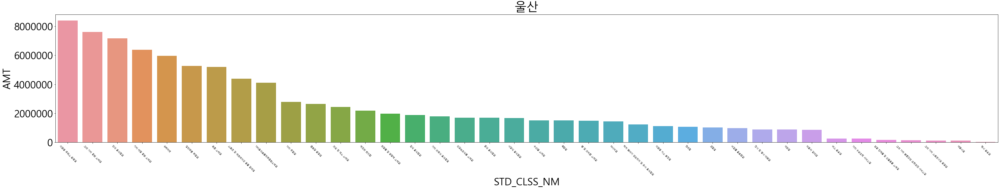

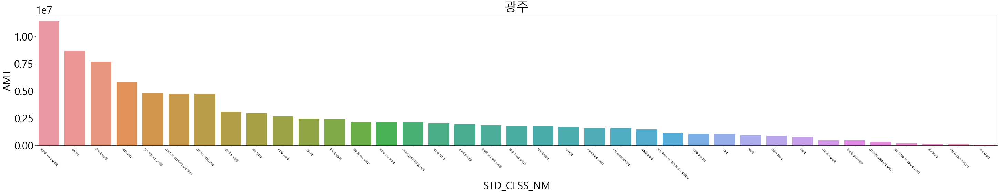

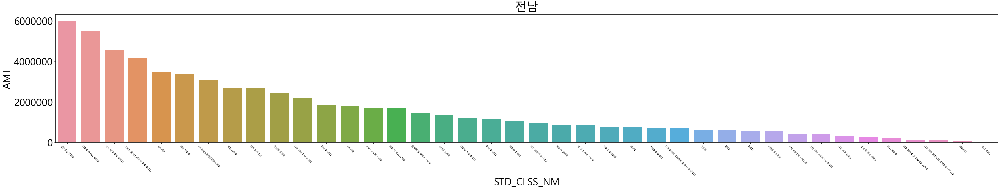

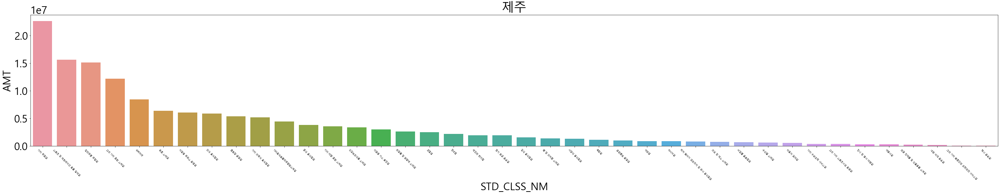

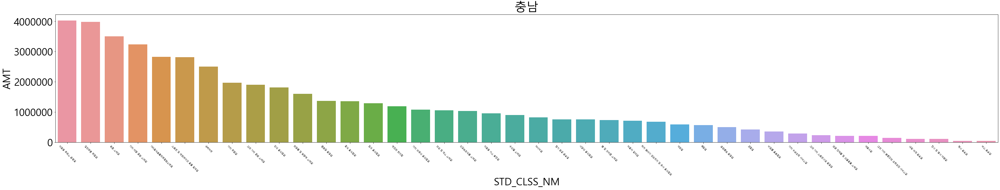

...

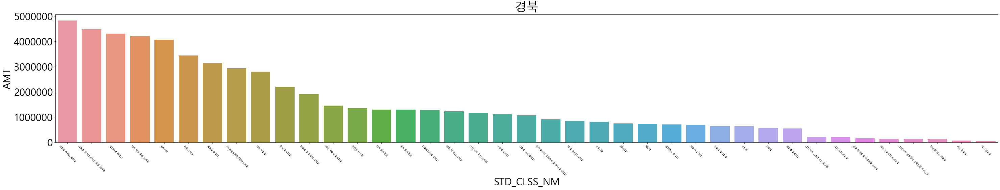

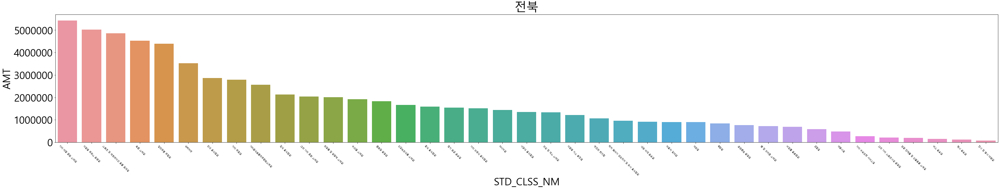

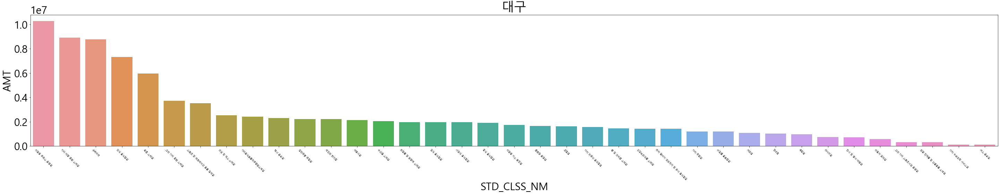

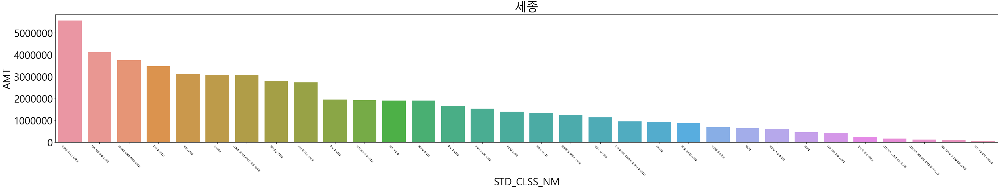

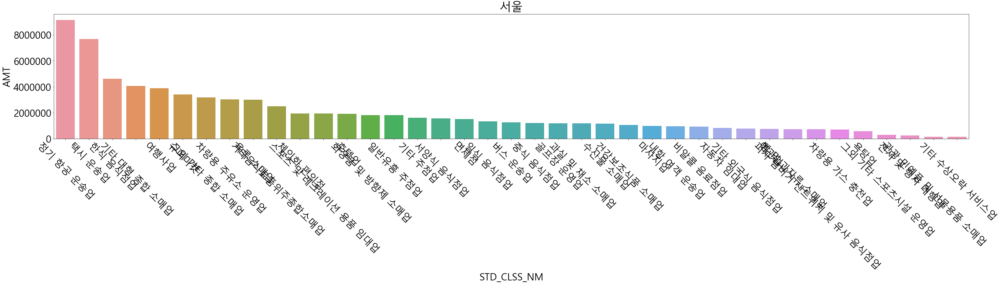

In [178]:
a = 0
for i in sido:
    data = sido_clss_amt_mean.loc[sido[a]].sort_values(by = 'AMT', ascending = False)
    plt.figure(figsize = (50,7))
    b.set_xticklabels(b.get_xticklabels(), fontsize=7)
    plt.xticks(rotation = - 45 )
    b = sns.barplot(data= data, x= data.index, y= 'AMT')
    plt.title(i)
    a+=1

In [179]:
sido_clss_amt_sum = train.groupby(['CARD_SIDO_NM','STD_CLSS_NM'])['AMT'].sum()
sido_clss_amt_sum = pd.DataFrame(sido_clss_amt_sum)

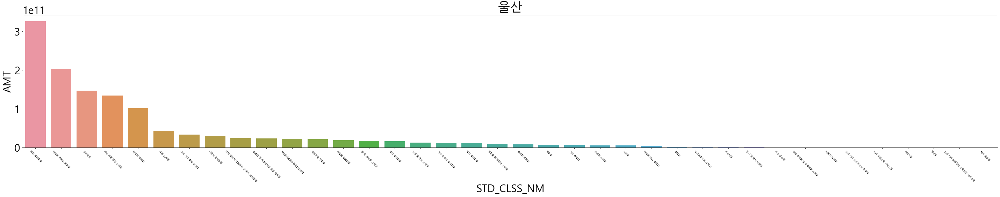

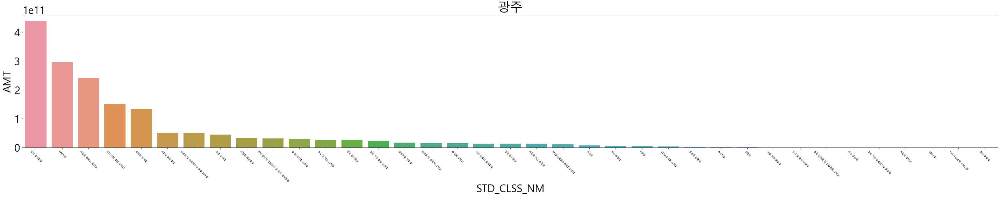

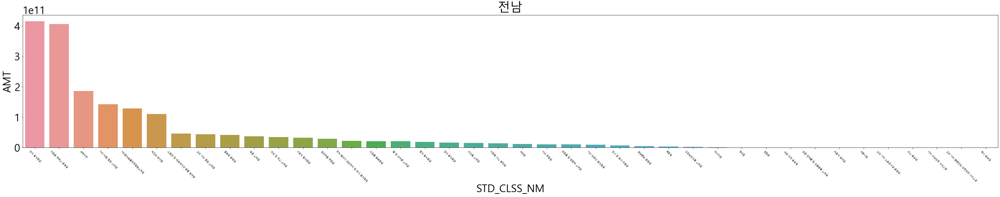

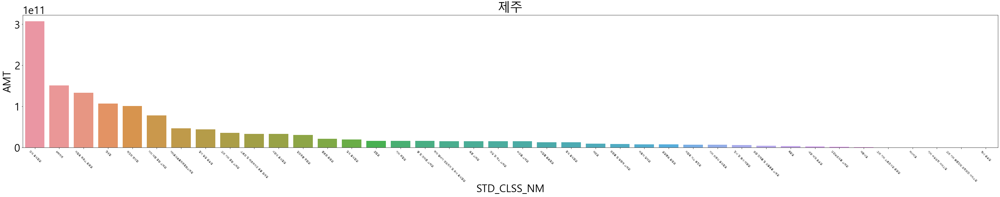

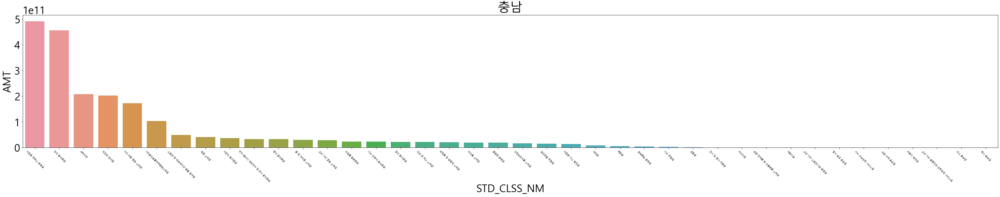

...

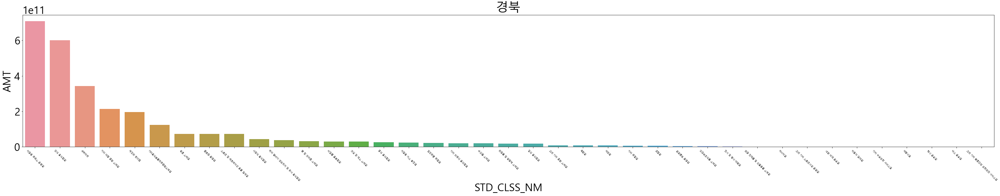

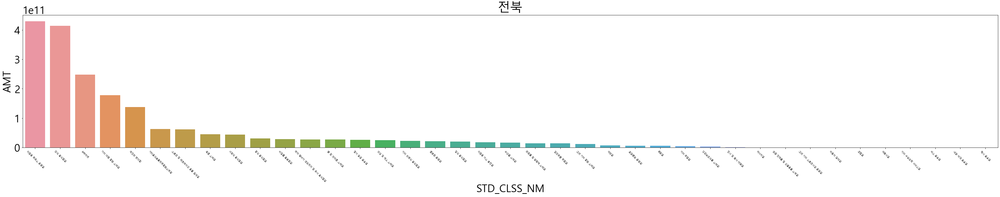

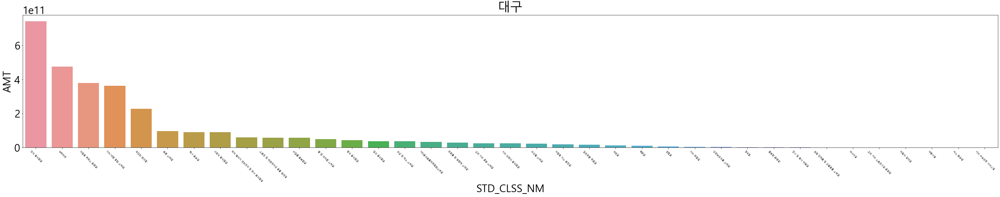

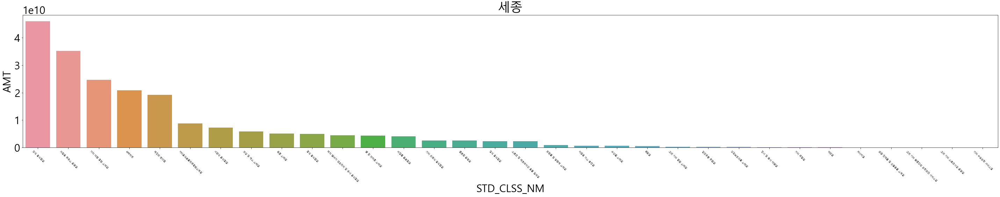

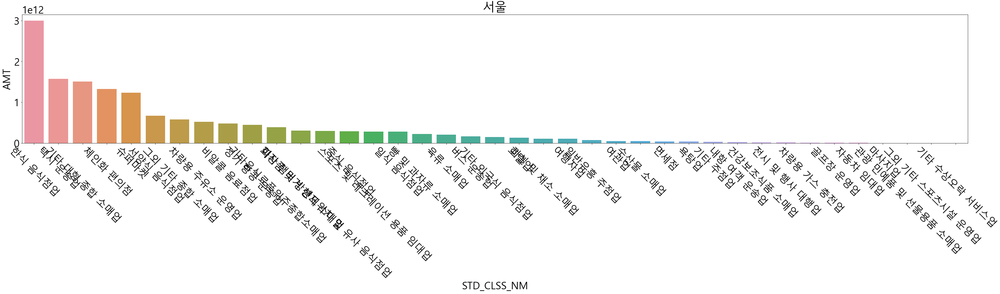

In [180]:
a = 0
for i in sido:
    data = sido_clss_amt_sum.loc[sido[a]].sort_values(by = 'AMT', ascending = False)
    plt.figure(figsize = (50,7))
    b.set_xticklabels(b.get_xticklabels(), fontsize=7)
    plt.xticks(rotation = - 45 )
    b = sns.barplot(data= data, x= data.index, y= 'AMT')
    plt.title(i)
    a+=1

## AMT MEAN 다시

In [232]:
amt_sido=train[['CARD_SIDO_NM','AMT']].groupby("CARD_SIDO_NM").sum()


amt_sido= amt_sido.reset_index()
amt_sido=amt_sido.sort_values(by="AMT",ascending=False)
amt_sido

,CARD_SIDO_NM,AMT
8,서울,14677131049031
1,경기,14201885234869
7,부산,4491306031541
2,경남,3485130029864
11,인천,3056247462913
5,대구,3020064352604
3,경북,2767620595248
15,충남,2103197375108
13,전북,1961230185341
12,전남,1839760777139


In [233]:
cnt_sido

,CARD_SIDO_NM,CNT
8,서울,994077624
1,경기,701143788
7,부산,228178463
5,대구,164232841
2,경남,149370331
11,인천,147173793
3,경북,113078004
15,충남,91093453
4,광주,82758813
13,전북,80723851


In [235]:
amt_cnt_sido = pd.merge(amt_sido, cnt_sido)
amt_cnt_sido 

,CARD_SIDO_NM,AMT,CNT
0,서울,14677131049031,994077624
1,경기,14201885234869,701143788
2,부산,4491306031541,228178463
3,경남,3485130029864,149370331
4,인천,3056247462913,147173793
5,대구,3020064352604,164232841
6,경북,2767620595248,113078004
7,충남,2103197375108,91093453
8,전북,1961230185341,80723851
9,전남,1839760777139,63787592


In [283]:
# train[['CARD_SIDO_NM','CNT']]

In [243]:
amt_cnt_sido["sido_mean"]= amt_cnt_sido["AMT"]/amt_cnt_sido["CNT"]
amt_cnt_sido=amt_cnt_sido.sort_values(by="sido_mean",ascending=False)
amt_cnt_sido

,CARD_SIDO_NM,AMT,CNT,sido_mean
13,제주,1343582224768,45168708,29745.86355
9,전남,1839760777139,63787592,28841.98509
11,강원,1589611299919,64382529,24690.10343
6,경북,2767620595248,113078004,24475.32232
8,전북,1961230185341,80723851,24295.54786
12,충북,1465437185923,61076110,23993.62346
3,경남,3485130029864,149370331,23332.14372
7,충남,2103197375108,91093453,23088.34835
14,울산,1255213605740,55429028,22645.41976
4,인천,3056247462913,147173793,20766.24785


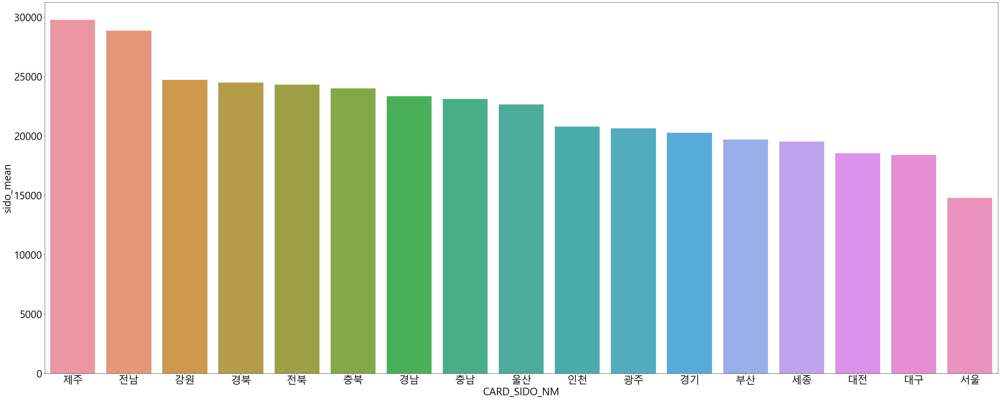

In [244]:
plt.figure(figsize = (50,20))
plt.rcParams.update({'font.size': 30})
sns.barplot(data=amt_cnt_sido,x= "CARD_SIDO_NM", y= 'sido_mean')

In [254]:
amt_clss=train[['STD_CLSS_NM','AMT']].groupby("STD_CLSS_NM").sum()


amt_clss= amt_clss.reset_index()
amt_clss=amt_clss.sort_values(by="AMT",ascending=False)
amt_clss

,STD_CLSS_NM,AMT
37,한식 음식점업,13737489719551
33,차량용 주유소 운영업,7708652073883
7,기타 대형 종합 소매업,7328854819388
20,슈퍼마켓,6730329364274
34,체인화 편의점,5303958703193
18,서양식 음식점업,1748358904526
35,택시 운송업,1733409541974
11,기타음식료품위주종합소매업,1569246626978
21,스포츠 및 레크레이션 용품 임대업,1245725426753
25,육류 소매업,1166039087386


In [255]:
cnt_clss

,STD_CLSS_NM,CNT
34,체인화 편의점,786933354
37,한식 음식점업,459130888
20,슈퍼마켓,422258631
7,기타 대형 종합 소매업,231338754
35,택시 운송업,231011553
16,비알콜 음료점업,164698712
33,차량용 주유소 운영업,138163614
18,서양식 음식점업,116457610
36,피자 햄버거 샌드위치 및 유사 음식점업,111352234
17,빵 및 과자류 소매업,88422041


In [256]:
amt_cnt_clss = pd.merge(amt_clss, cnt_clss)
amt_cnt_clss 

,STD_CLSS_NM,AMT,CNT
0,한식 음식점업,13737489719551,459130888
1,차량용 주유소 운영업,7708652073883,138163614
2,기타 대형 종합 소매업,7328854819388,231338754
3,슈퍼마켓,6730329364274,422258631
4,체인화 편의점,5303958703193,786933354
5,서양식 음식점업,1748358904526,116457610
6,택시 운송업,1733409541974,231011553
7,기타음식료품위주종합소매업,1569246626978,81708225
8,스포츠 및 레크레이션 용품 임대업,1245725426753,14194845
9,육류 소매업,1166039087386,36744934


In [257]:
amt_cnt_clss["clss_mean"]= amt_cnt_clss["AMT"]/amt_cnt_clss["CNT"]
amt_cnt_clss=amt_cnt_clss.sort_values(by="clss_mean",ascending=False)
amt_cnt_clss

,STD_CLSS_NM,AMT,CNT,clss_mean
30,여행사업,109016697282,296628,367519.91478
20,정기 항공 운송업,581098689779,2453445,236850.09844
35,자동차 임대업,28378647000,178093,159347.34661
19,골프장 운영업,595701968828,4951383,120310.21814
21,일반유흥 주점업,541315173187,4907804,110296.81976
36,마사지업,20199890964,190516,106027.26786
29,기타 주점업,164753620805,1641765,100351.52461
22,면세점,404512192532,4194293,96443.47511
31,건강보조식품 소매업,105126364380,1097627,95776.03720
8,스포츠 및 레크레이션 용품 임대업,1245725426753,14194845,87759.00172


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40]),
 <a list of 41 Text xticklabel objects>)

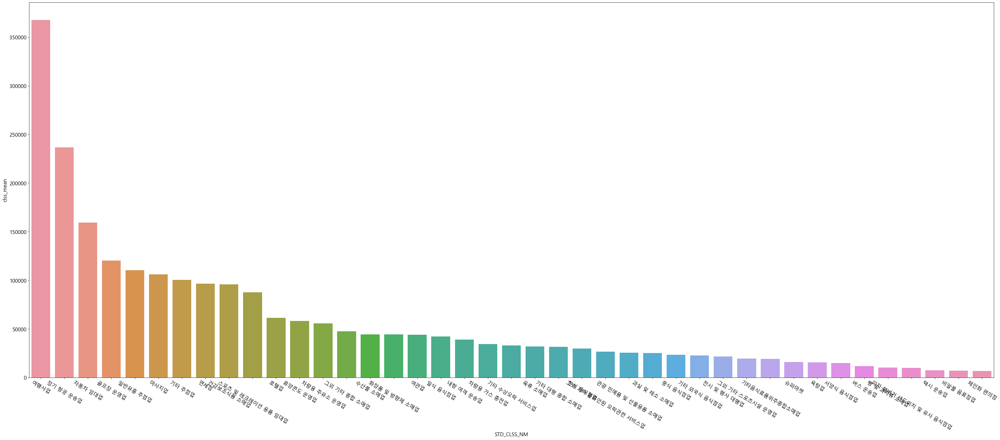

In [262]:
plt.figure(figsize = (50,20))
sns.barplot(data=amt_cnt_clss,x= "STD_CLSS_NM", y= 'clss_mean')
plt.rc('font', size=15)
plt.xticks(rotation = -30)

In [282]:
clss_g = train.groupby(['STD_CLSS_NM','CARD_SIDO_NM'])['AMT','CNT'].sum()
clss_g = pd.DataFrame(clss_g)
clss_g

C:\Users\noeul\anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


AMT     CNT
STD_CLSS_NM CARD_SIDO_NM                     
건강보조식품 소매업  강원             1820824382   16170
            경기            21313151258  227521
            경남             5406038964   52310
            경북             3564454980   28506
            광주             3619007849   28428
...                               ...     ...
휴양콘도 운영업    전남             4192316889   73010
            전북             6346178051   92415
            제주             7475474469  107836
            충남             3967138248   67556
            충북             2414736980   40731

[650 rows x 2 columns]

In [284]:
clss_g["clss_g_mean"]=clss_g["AMT"]/clss_g["CNT"]
clss_g

AMT     CNT  clss_g_mean
STD_CLSS_NM CARD_SIDO_NM                                  
건강보조식품 소매업  강원             1820824382   16170 112605.09474
            경기            21313151258  227521  93675.53438
            경남             5406038964   52310 103346.18551
            경북             3564454980   28506 125042.27110
            광주             3619007849   28428 127304.34251
...                               ...     ...          ...
휴양콘도 운영업    전남             4192316889   73010  57421.13257
            전북             6346178051   92415  68670.43284
            제주             7475474469  107836  69322.62388
            충남             3967138248   67556  58723.69957
            충북             2414736980   40731  59284.99128

[650 rows x 3 columns]

In [272]:
CLSS_NM_uniq

array(['건강보조식품 소매업', '골프장 운영업', '과실 및 채소 소매업', '관광 민예품 및 선물용품 소매업',
       '그외 기타 스포츠시설 운영업', '그외 기타 종합 소매업', '기타 대형 종합 소매업', '기타 외국식 음식점업',
       '기타 주점업', '기타음식료품위주종합소매업', '마사지업', '비알콜 음료점업', '빵 및 과자류 소매업',
       '서양식 음식점업', '수산물 소매업', '슈퍼마켓', '스포츠 및 레크레이션 용품 임대업', '여관업', '욕탕업',
       '육류 소매업', '일반유흥 주점업', '일식 음식점업', '전시 및 행사 대행업', '중식 음식점업',
       '차량용 가스 충전업', '차량용 주유소 운영업', '체인화 편의점', '피자 햄버거 샌드위치 및 유사 음식점업',
       '한식 음식점업', '호텔업', '화장품 및 방향제 소매업', '휴양콘도 운영업', '여행사업', '자동차 임대업',
       '면세점', '버스 운송업', '택시 운송업', '기타 수상오락 서비스업', '내항 여객 운송업',
       '그외 기타 분류안된 오락관련 서비스업', '정기 항공 운송업'], dtype=object)

In [285]:
clss_g.loc[CLSS_NM_uniq[3]]

,AMT,CNT,clss_g_mean
CARD_SIDO_NM,,,
강원,457212008,22012,20771.03434
경기,1918411391,79575,24108.21729
경남,746296081,23213,32149.91948
경북,786397642,45459,17299.05282
광주,194631290,7242,26875.35073
대구,380096905,8061,47152.57474
대전,238234991,6232,38227.69432
부산,997758961,24683,40422.92108
서울,3346798725,168440,19869.38212


In [291]:
clss_g.loc[CLSS_NM_uniq[2]]

,AMT,CNT,clss_g_mean
CARD_SIDO_NM,,,
강원,16675489268,428427,38922.59187
경기,104789326737,4847063,21619.13859
경남,42281889072,1270009,33292.59011
경북,29057027933,833145,34876.31557
광주,27007077534,846938,31887.90388
대구,36395145714,1875995,19400.44921
대전,13882801638,518035,26798.96462
부산,69244220590,3878885,17851.57863
서울,110331062192,4899447,22519.08474


C:\Users\noeul\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
C:\Users\noeul\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
C:\Users\noeul\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max

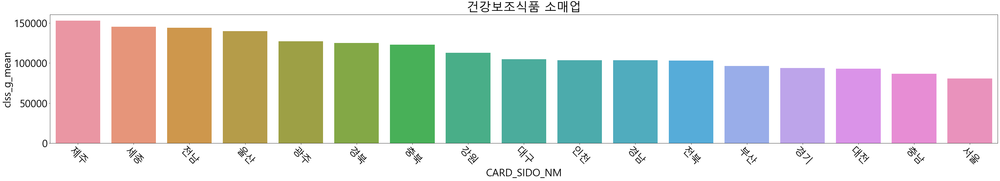

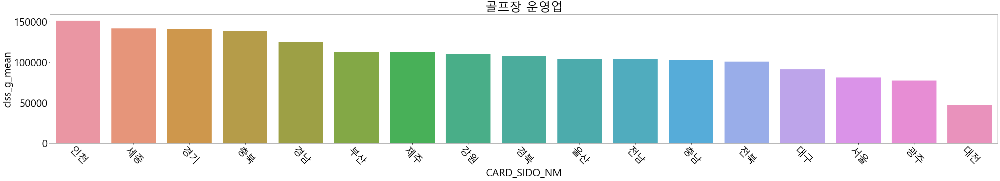

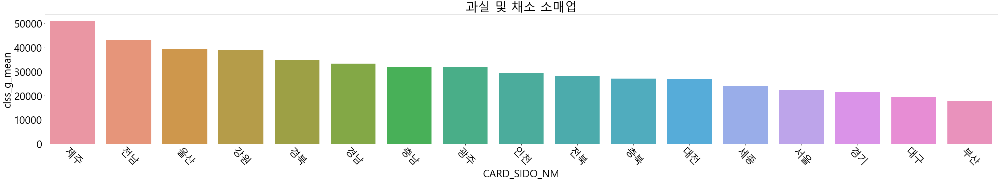

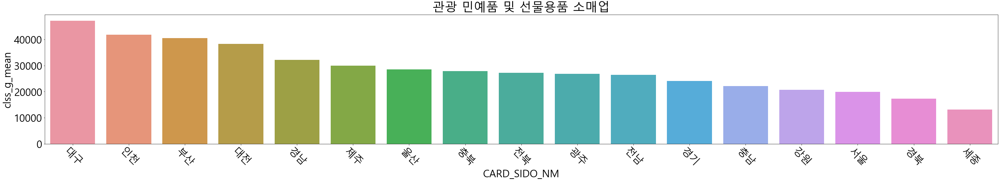

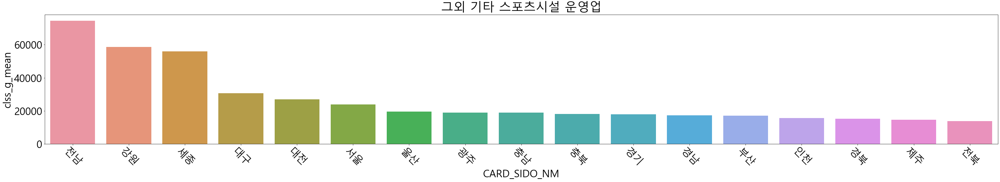

...

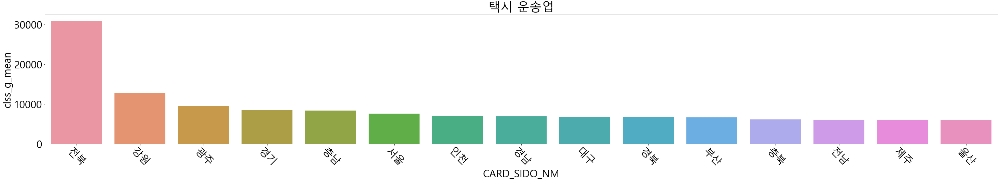

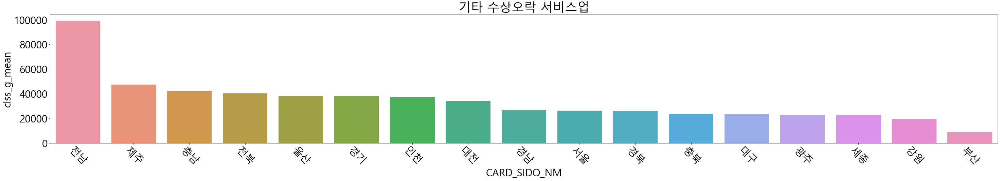

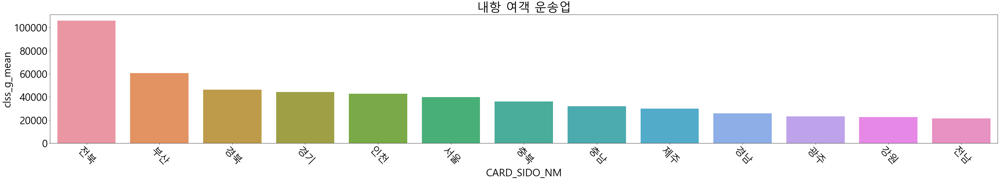

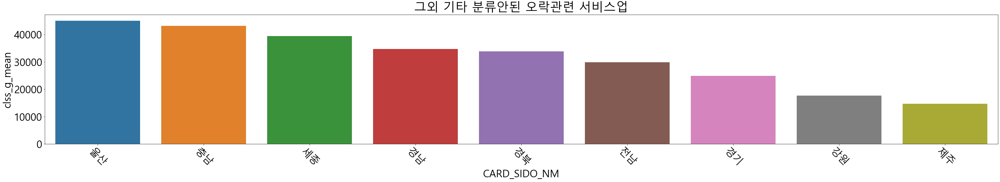

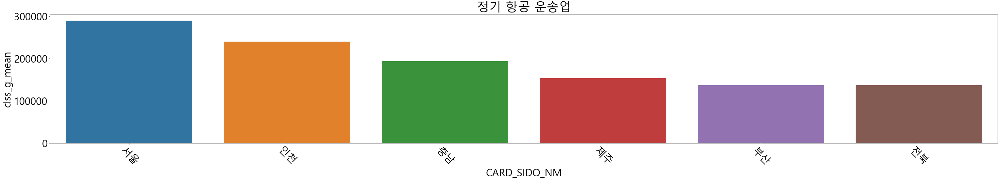

In [290]:
a = 0
for i in CLSS_NM_uniq :
#     c=b[i]    
    
    data = clss_g.loc[CLSS_NM_uniq[a]].sort_values(by = 'clss_g_mean', ascending = False)
    plt.figure(figsize = (50,7))
    plt.rcParams.update({'font.size': 30})
    plt.xticks(rotation = - 45 )
    b = sns.barplot(data= data, x= data.index, y= 'clss_g_mean')
    plt.title(i)
    a+=1
    
#  업종별로 인당 -지역에서 얼마나 돈을 많이 쓰는지 확인 가능

In [295]:
sido_g = train.groupby(['CARD_SIDO_NM','STD_CLSS_NM'])['AMT','CNT'].sum()
sido_g = pd.DataFrame(sido_g)
sido_g

C:\Users\noeul\anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


AMT       CNT
CARD_SIDO_NM STD_CLSS_NM                                  
강원           건강보조식품 소매업               1820824382     16170
             골프장 운영업                 51290887138    465266
             과실 및 채소 소매업             16675489268    428427
             관광 민예품 및 선물용품 소매업         457212008     22012
             그외 기타 분류안된 오락관련 서비스업         177000        10
...                                          ...       ...
충북           피자 햄버거 샌드위치 및 유사 음식점업   21294163365   2004621
             한식 음식점업                327145423793  11522939
             호텔업                       530914357     11641
             화장품 및 방향제 소매업            9175488855    224483
             휴양콘도 운영업                 2414736980     40731

[650 rows x 2 columns]

In [296]:
sido_g["sido_g_mean"]=sido_g["AMT"]/sido_g["CNT"]
sido_g

AMT       CNT  sido_g_mean
CARD_SIDO_NM STD_CLSS_NM                                               
강원           건강보조식품 소매업               1820824382     16170 112605.09474
             골프장 운영업                 51290887138    465266 110239.92112
             과실 및 채소 소매업             16675489268    428427  38922.59187
             관광 민예품 및 선물용품 소매업         457212008     22012  20771.03434
             그외 기타 분류안된 오락관련 서비스업         177000        10  17700.00000
...                                          ...       ...          ...
충북           피자 햄버거 샌드위치 및 유사 음식점업   21294163365   2004621  10622.53831
             한식 음식점업                327145423793  11522939  28390.79716
             호텔업                       530914357     11641  45607.28090
             화장품 및 방향제 소매업            9175488855    224483  40873.86954
             휴양콘도 운영업                 2414736980     40731  59284.99128

[650 rows x 3 columns]

In [294]:
SIDO_NM_uniq

array(['강원', '경기', '경남', '경북', '광주', '대구', '대전', '부산', '서울', '세종', '울산',
       '인천', '전남', '전북', '제주', '충남', '충북'], dtype=object)

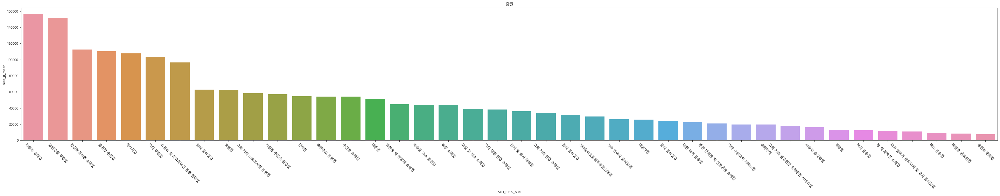

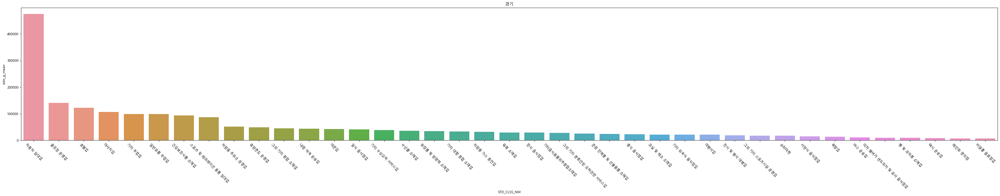

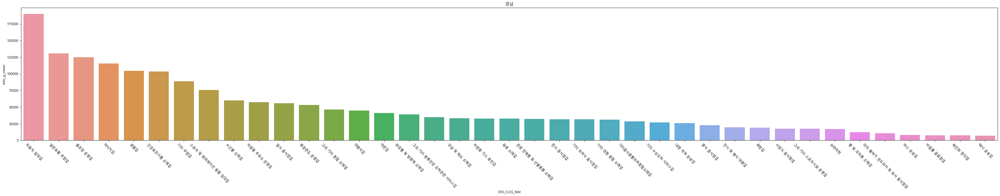

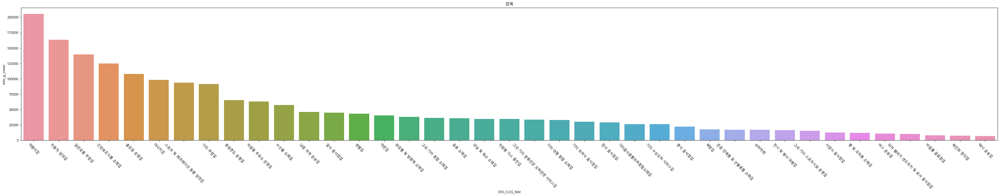

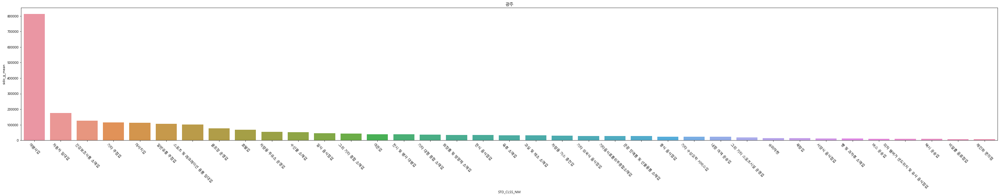

...

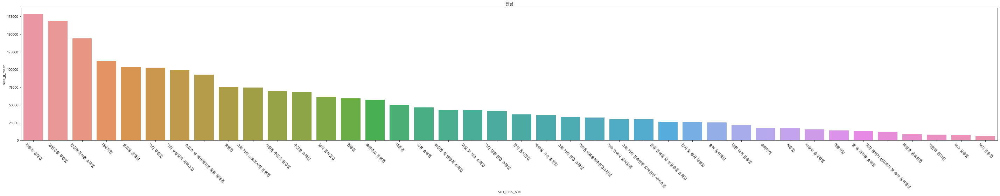

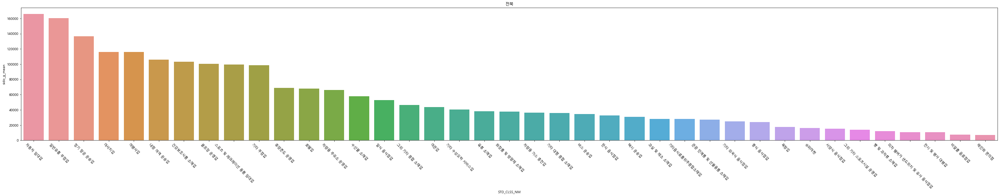

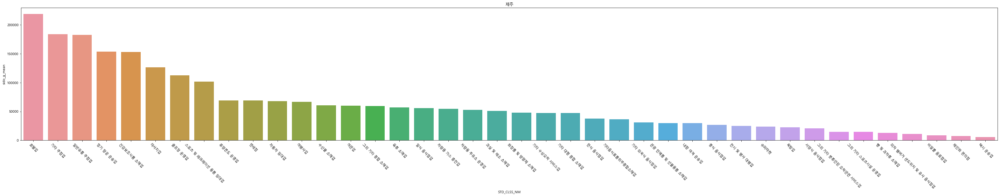

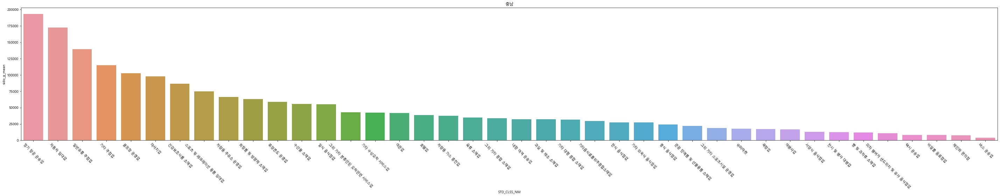

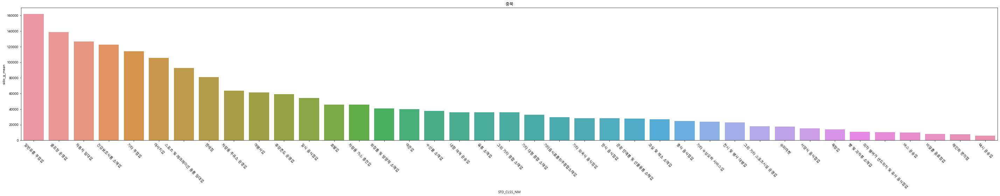

In [300]:
a = 0
for i in SIDO_NM_uniq :
#     c=b[i]    
    
    data = sido_g.loc[SIDO_NM_uniq[a]].sort_values(by = 'sido_g_mean', ascending = False)
    plt.figure(figsize = (50,7))
    plt.rcParams.update({'font.size': 10})
    plt.xticks(rotation = - 45 )
    b = sns.barplot(data= data, x= data.index, y= 'sido_g_mean')
    plt.title(i)
    a+=1
    
#  시도별로 인당 -업종에서 얼마나 돈을 많이 쓰는지 확인 가능